# 3803ICT Big Data Analysis Assignment

Joshua Russell | s5057545 | joshua.russell2@griffithuni.edu.au 

Joshua Mitchell | s5055278 | joshua.mitchell4@griffithuni.edu.au

## Part 2 - Data Analysis and Interpretation

## Introduction

The following study explores the concepts of Data Analysis and Interpretation, Visualisation, Analysis of Special Types of Data and Analysis with Big Data Infrastructure. Exploratory Data Analysis was used to gather further intuition about the attributes of the dataset, and to gain insight into the underlying trends and chracteristics of the data. Statistical Data Analysis was used to examine the trends of Measures of Central Tendency and the Measures of Dispersion, as well as for the supervised learning task of regression. Predictive Data Analysis was used on time series data for temporal predictions through forecasting techniques. Data Visualisation techniques were utilised to perform spatial and textual data visualisation in order to find additional insights into the trends of the data, and to present the data in a way that was informative and intuitive to a regular viewer. Textual data analytics was used to extract sector-related skillsets from the job advertisement descriptions. Lastly, Distributed Data Analysis was utilised for improving the efficiency of the data analysis study.

The sections of the analysis are as follows:

#### 1) Studying the Job Metadata

- Dataset attributes
    - Company and job type
    - Job title
    - Job area
- What is the range of salaries for each job?
- Salary Distributions
    - Distribution of salaries for classification
    - Distribution of salaries for subclassification

#### 2) Studying the Market by Locations

- What is the market size in each city? 
    - Pie chart analysis of the market size in each city
    - Bubble map analysis of the market size in each city
- Which are the hottest job sectors in each city? 
- Which range of salary is common in each city?
- Where are the employees more wellpaid?
- Has salary changed over the 6 months?
    - Regressions
- Detecting the pattern of job posting
    - Breaking frequency up into trend, seasonality and residual/noise graphs

#### 3) Studying the Market by Sectors

- Which sectors keep the highest market share?
- In each sector, which sub-sectors are the main spotlights?
- What is the salary range for each sector/sub-sector?
- Can you compare salary range between sectors/sub-sectors?
- Can you detect which skills are required in each sector?
    - Top skillsets for each sector
    - Determine if words are worth being stop words for the skillset search
    - Top skillsets over all sectors
    - Word clouds
    - Scatter text
- What is trending in the job market?

#### Interactive Web Page 

We developed an interactive web page to visualize the results of the analysis. It can be accessed via the following link: 
https://stage-dot-linuxvm-216704.appspot.com/

In [1]:
# Imports
import re
import math
import json
import spacy
import string
import typing
import folium
import unicodedata

import bs4 as bs
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import scattertext as st
import matplotlib.pyplot as plt

from math import sqrt
from datetime import date
from collections import Counter
from nltk.corpus import stopwords
from IPython.display import IFrame
from nltk.stem import PorterStemmer
from geopy.geocoders import Nominatim
from sklearn import feature_extraction
from matplotlib.colors import ListedColormap
from IPython.core.display import display, HTML
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

from sklearn.externals.joblib import Memory
from sklearn.metrics import mean_squared_error
from sklearn.metrics.pairwise import linear_kernel
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

%matplotlib inline
%config IPCompleter.greedy=True

memory = Memory(location='/tmp', verbose=0)

# Increase the width of the notebook for displaying graphs
display(HTML("<style>.container { width:75% !important; }</style>"))

# Set figure aesthetics
sns.set()

In [2]:
# Imports for PySpark
import findspark
findspark.init()
findspark.find()

import pyspark
from pyspark.sql import SparkSession, SQLContext
from pyspark import SparkContext, SparkConf

# Configure PySpark and setup main entry point for DataFrame and SQL functionality
conf = pyspark.SparkConf().setAppName('appName').setMaster('local')
sc = pyspark.SparkContext(conf=conf)
spark = SparkSession(sc)
sqlContext = SQLContext(sc)

In [3]:
# Load the preprocessed job market dataset into a pandas DataFrame
df = pd.read_csv("preprocessed_data.csv", dtype={"Location": np.str, "Area": np.str, 
                                                 "Classification": np.str, "SubClassification": np.str})
df = df.drop("Unnamed: 0", 1)

In [4]:
# Create a copy of the pandas DataFrame for PySpark
df_copy = df.copy()

# Delete the Requirement and FullDescription attributes to save memory with PySpark
df_copy = df_copy.drop('Requirement', 1)
df_copy = df_copy.drop('FullDescription', 1)

# Ensure the attribute types of the DataFrame are as expected before using to create the PySpark DataFrame
df_copy[['Title', 'Company', 'Location', 'Area', 'Classification', 'SubClassification', 'JobType']] = df_copy[[
    'Title', 'Company', 'Location', 'Area', 'Classification', 'SubClassification', 'JobType']].astype(str)

# Create the PySpark DataFrame
spark_df = sqlContext.createDataFrame(df_copy)

# Create a table that is a pointer to the DataFrame for processing SQL queries
spark_df.registerTempTable("job_listings")

## 1) Studying the Job Metadata

### Dataset attributes

Here we briefly examine the job metadata using a particular sector (namely Information Communication Technology). Since we do not want to limit our investigation to one sector, this study will be conducted with a particular sector just to demonstrate the charateristics of the dataset, and to determine which attributes will be used in the overall analysis. The following sections will therefore consider the entire dataset, not limited to any particular sector.

In [5]:
# Examine the attributes of the dataset
print("{:<20}".format("Attributes of the SEEK Dataset"))
print("{:<20}".format("------"))
for col in list(df.columns):
    print("{:<20}".format(col))

Attributes of the SEEK Dataset
------              
Id                  
Title               
Company             
Date                
Location            
Area                
Classification      
SubClassification   
Requirement         
FullDescription     
LowestSalary        
HighestSalary       
JobType             
LowestSalaryScaled  
HighestSalaryScaled 


#### Company and job type

In [6]:
# Further examine the top posting companies for the ICT sector
query_df = sqlContext.sql("SELECT Company, COUNT(*) \
                           FROM job_listings \
                           GROUP BY Company \
                           ORDER BY COUNT(*) DESC").toPandas()
query_df = query_df.drop(query_df.loc[query_df["Company"].str.match("nan")].index)
top_5_companies = query_df["Company"].tolist()[:5]
top_5_counts = query_df["count(1)"].tolist()[:5]

# Display the top 5 job posting companies for the ICT sector
print("Top 5 Job Posting Companies on SEEK for the ICT Sector\n")
print("{:<15} {}".format("Company", "No. Listings"))
print("{:<15} {}".format("-------", "------------"))
for company, count in zip(top_5_companies, top_5_counts):
    print("{:<15} {:>12}".format(company.title(), count))

Top 5 Job Posting Companies on SEEK for the ICT Sector

Company         No. Listings
-------         ------------
Jora Local              9354
Hudson                  1668
Design Build            1547
Robert Walters          1385
Paxus                   1325


In [7]:
# Further examine the distribution of job types within the ICT sector
query_df = sqlContext.sql("SELECT JobType, COUNT(*) \
                           FROM job_listings \
                           WHERE Classification='information communication technology'\
                           GROUP BY JobType \
                           ORDER BY COUNT(*) DESC").toPandas()
query_df = query_df.drop(query_df.loc[query_df["JobType"].str.match("nan")].index)

# Display the distribution of job types within the ICT sector
print("Distribution of Job Types witin the ICT Sector\n")
print("{:<15} {}".format("Job Type", "No. Listings"))
print("{:<15} {}".format("--------", "------------"))
for job_type, count in zip(query_df["JobType"].tolist(), query_df["count(1)"].tolist()):
    print("{:<15} {:>12}".format(job_type.title(), count))

Distribution of Job Types witin the ICT Sector

Job Type        No. Listings
--------        ------------
Full Time              11188
Contracttemp            9831
Part Time                 77
Casualvacation            67


#### Job title

In [8]:
# Examine examples of job listing titles within the dataset
query_df = sqlContext.sql("SELECT Title \
                           FROM job_listings \
                           WHERE Classification='information communication technology'").toPandas()
query_df = query_df.drop(query_df.loc[query_df["Title"].str.match("nan")].index)

# Display the first 10 titles of job listings from the ICT sector
print("Examples of Job Listing Titles from the ICT Sector\n")
print("Title")
print("-----")
for title in query_df["Title"].tolist()[:10]:
    print(title.title())

Examples of Job Listing Titles from the ICT Sector

Title
-----
Technical Support Engineer
Business Development Manager
Systems Engineer
Operations Delivery Manager
Technical Support Executive 70K Super Cbd Funky Offices
Senior Business Development Manager
Senior Manager Security Incident Response Management
Security Incident Response Specialist
Cloud Security Architect
Sam Consultant


In [9]:
# Examine the sub-sectors within the ICT sector
query_df = sqlContext.sql("SELECT SubClassification, COUNT(*) \
                           FROM job_listings \
                           WHERE Classification='information communication technology' \
                           GROUP BY SubClassification \
                           ORDER BY COUNT(*) DESC").toPandas()
query_df = query_df.drop(query_df.loc[query_df["SubClassification"].str.match("nan")].index)
subsectors = query_df["SubClassification"].tolist()
counts = query_df["count(1)"].tolist()

# Display the sub-sectors for the ICT sector
print("Sub-sectors for the ICT Sector\n")
print("{:<35} {}".format("Sub-sector", "No. Listings"))
print("{:<35} {}".format("----------", "------------"))
for subsector, count in zip(subsectors, counts):
    print("{:<35} {:>12}".format(subsector.title(), count))

Sub-sectors for the ICT Sector

Sub-sector                          No. Listings
----------                          ------------
Developersprogrammers                       4211
Businesssystems Analysts                    2986
Programme Project Management                2413
Architects                                  1548
Engineering Software                        1437
Help Desk It Support                        1374
Networks Systems Administration             1194
Consultants                                 1149
Other                                        997
Testing Quality Assurance                    831
Security                                     774
Management                                   746
Engineering Network                          552
Database Development Administration          551
Web Development Production                   452
Sales Pre Post                               449
Product Management Development               376
Telecommunications                   

#### Job area

In [10]:
# Examine the top areas for the ICT sector
query_df = sqlContext.sql("SELECT Area, COUNT(*) \
                           FROM job_listings \
                           GROUP BY Area \
                           ORDER BY COUNT(*) DESC").toPandas()
query_df = query_df.drop(query_df.loc[query_df["Area"].str.match("nan")].index)
top_areas = query_df["Area"].tolist()[:10]
top_counts = query_df["count(1)"].tolist()[:10]

# Display the top 10 areas for the ICT sector
print("Top 10 Job Areas for the ICT Sector\n")
print("{:<30} {}".format("Area", "No. Listings"))
print("{:<30} {}".format("----", "------------"))
for area, count in zip(top_areas, top_counts):
    print("{:<30} {:>12}".format(area.title(), count))

Top 10 Job Areas for the ICT Sector

Area                           No. Listings
----                           ------------
Cbd Inner Suburbs                     32170
Cbd Inner West Eastern Suburbs        29059
Parramatta Western Suburbs             8769
Bayside South Eastern Suburbs          6707
North Shore Northern Beaches           6656
Northern Suburbs                       6436
Eastern Suburbs                        6361
Cbd Inner Western Suburbs              5570
Western Suburbs                        4285
South West M5 Corridor                 3190


In [11]:
# Examine the top locations for the ICT sector
query_df = sqlContext.sql("SELECT Location, COUNT(*) \
                           FROM job_listings \
                           GROUP BY Location \
                           ORDER BY COUNT(*) DESC").toPandas()
query_df = query_df.drop(query_df.loc[query_df["Location"].str.match("nan")].index)
top_locations = query_df["Location"].tolist()[:10]
top_counts = query_df["count(1)"].tolist()[:10]

# Display the top 10 location for the ICT sector
print("Top 10 Job Locations for the ICT Sector\n")
print("{:<30} {}".format("Location", "No. Listings"))
print("{:<30} {}".format("--------", "------------"))
for location, count in zip(top_locations, top_counts):
    print("{:<30} {:>12}".format(location.title(), count))

Top 10 Job Locations for the ICT Sector

Location                       No. Listings
--------                       ------------
Sydney                                60765
Melbourne                             46690
Brisbane                              21466
Perth                                 13198
Adelaide                               6653
Act                                    6250
Newcastle Maitland Hunter              3958
Gold Coast                             3588
South West Coast Vic                   1790
Mackay Coalfields                      1701


The preceding analysis was conducted to determine which attributes are to be used in the analysis. We came into this analysis knowing that we would be investigating the classification and subclassification attributes since they are related to the job sector analysis we were wanting to conduct. Furthermore, for time series and trend analysis, the date attribute was required, so we knew that the date attribute was also going to be used for the analysis. Lastly, in *Part 1 - Data Preparation and Preprocessing*, we stated that either the requirement or full description attributes would be used for extracting skillsets, that salary data would be used for numerical analysis, and that the id attribute was only useful for working with PySpark. This left us with the following attributes: title, company, location, area, and job type. As a result, we broke the analysis into three distinct sections: *company and job type*, *job title*, and *job area*. In the first section, *company and job type*, we found that other employment marketplace companies were posting a significant number of jobs on SEEK. This information is interesting, however we decided that since we only have information about the company names, and have no additional data in regard to them, that we would not use this information in the analysis. In regard to job type, we thought that although it would be insightful to see the distribution of job types across locations and sectors, it would be best to consider all job types just as jobs for the rest of the analysis, rather than breaking them up into distinct studies. Consequently, this attribute was not used witin the analysis. Within the *job title* section, we found that job titles mainly describe the subclassification of the job listing. Consequently, we decided that since the attribute was practically a noisier representation of subclassification, that it would not be used. We assume that natural language processing techniques could uncover some interesting factors regarding the titles of jobs in other studies. The last section, *job area*, showed that the area attribute required the context of the location attribute to understand where the area was. Since we assumed that breaking up the location analysis further into areas would not be as intuitive or insightful for the investigations, we decided that we would not use the area attribute in the studies. As a result, the following data analysis and interpretation will investigate the date, location, classification, subclassification, requirement, full description, and salary-related attributes of the SEEK dataset.

### What is the range of salaries for each job?

In [12]:
# Get the overall salary range
query_df = sqlContext.sql("SELECT DISTINCT LowestSalary \
                           FROM job_listings").toPandas()
lowest_salary = query_df["LowestSalary"].min()

query_df = sqlContext.sql("SELECT DISTINCT HighestSalary \
                           FROM job_listings").toPandas()
highest_salary = query_df["HighestSalary"].max()

print("The salaries of all jobs range from {} to {}".format(lowest_salary, highest_salary))

The salaries of all jobs range from 0 to 999


In [13]:
# Get a list of the salary ranges from low and high salary columns for labeling graphs
query_df = sqlContext.sql("SELECT DISTINCT LowestSalary \
                           FROM job_listings \
                           ORDER BY LowestSalary").toPandas()
unique_low_salaries = list(query_df["LowestSalary"])

query_df = sqlContext.sql("SELECT DISTINCT HighestSalary \
                           FROM job_listings \
                           ORDER BY HighestSalary").toPandas()
unique_high_salaries = list(query_df["HighestSalary"])

no_ranges = len(unique_low_salaries)
salary_range_labels = []

for i in range(no_ranges):
    if i == no_ranges -1:
        label = str(unique_low_salaries[i]) + '-' + '200+'
    else:
        label = str(unique_low_salaries[i]) + '-' + str(unique_high_salaries[i])
    salary_range_labels.append(label)

print(salary_range_labels)

['0-30', '30-40', '40-50', '50-60', '60-70', '70-80', '80-100', '100-120', '120-150', '150-200', '200-200+']


### Salary Distributions

Here we investigate the salary distributions of each of the sectors/classifications. Knowing the distribution of a certain sector can provide a guide as to where you should take your career path if your measure of success is wealth. Furthermore, we take our analysis further by looking at the sub-sector distributions to provide more specific information for each sector. Using a ridge plot we can easily compare these sub-sector distributions to find those that have better prospects. 

Firstly, we choose to plot a 5 by 6 grid of all of the sectors followed by a 5 by 6 grid of a subset of the sub-sectors. Each subset of sector can be iterated through by changing the subset variable. Because this is laborious to look through, a ridge plot of a particular sector's sub-sectors is plotted to further analyse each sector. The ridgeplot uses the normalised lowest salary column to create continuous and flowing plots.

Our results show that the sectors with the greatest frequencies in the higher salary range are information communication technology, legal, mining resources energy, ceo general management and construction. Those on the lower end are hospitality tourism, call centre customer service, and manufactoring transport logistics. These sectors don't provide lucritive career paths and are generally dead end jobs with no room to move up higher in the hierarchy. Therefore people should avoid to pursue sectors with further right skewed distributions. Looking at the subsectors of ICT shows that even within sectors there are large differences in salary distribution. For instance, help desk it support is on the far left, similar to the lower end sectors while (system) architects are on the opposite end of the spectrum. Although, compared to hospitality and tourism, ICT still has far more sub-sectors on the higher end. Manufactoring transport logistics and similar low end sectors have little variation in their sub-sector distributions. So taking positions within these sectors may restrict people from even attempting to pursue higher salary positions as it's far more difficult to move between sectors than subsectors.

#### Distribution of salaries for classification

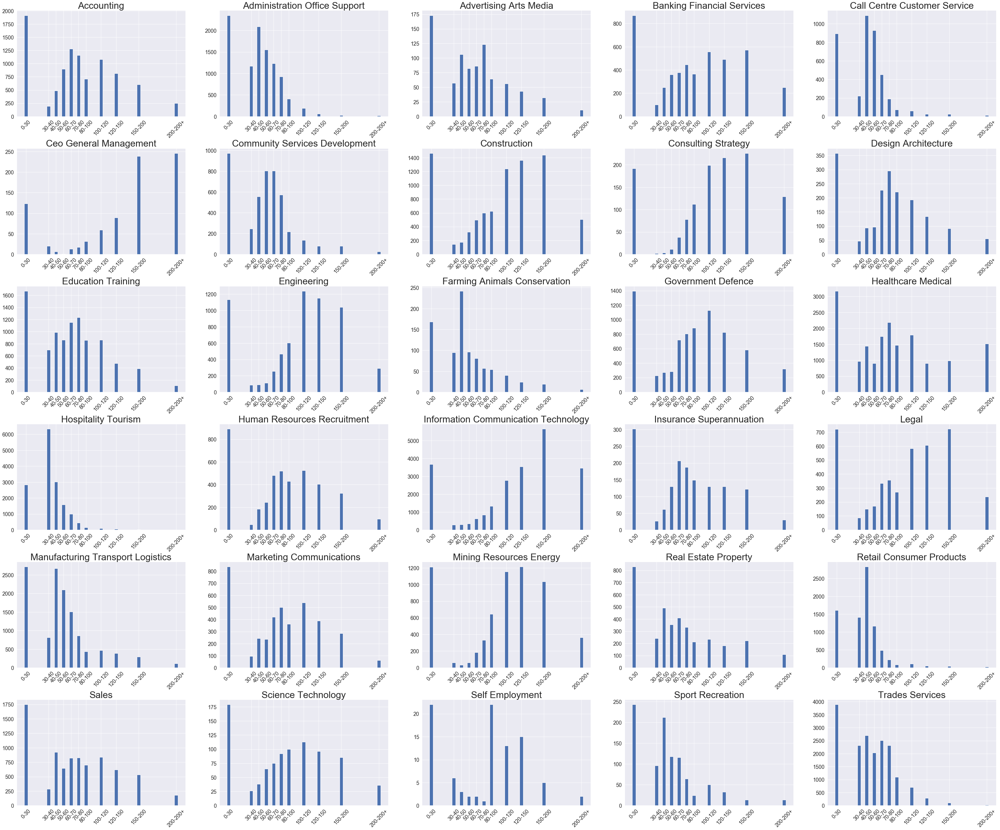

In [14]:
# Get the frequency of the low and high salary values for each classification
class_low_salary_freq = df.groupby("Classification")["LowestSalary"].value_counts(sort=False)

class_distribution = {}

# Create a matrix of matplotlib plots of size 6 rows by 5 columns
fig, axs = plt.subplots(6, 5, figsize=(60, 50))
plt.subplots_adjust(hspace=0.3)

# Reset the matplotlib font size to change the x tick label size
plt.rcParams.update({'font.size': 20})

# Iterator for each of the subplots
ax_iter = iter(axs.flat)
i = 0

# Place the salary frequency values into a dictionary
for key, value in class_low_salary_freq.items():
    
    # If at the end of the current classification, then reset i for the new list of frequencies
    if i == len(unique_low_salaries):
        i = 0
        
    # For each current classification, append the frequency value
    if key[0] in class_distribution:
        class_distribution[key[0]].append(value)
    else:
        class_distribution[key[0]] = []
        class_distribution[key[0]].append(value)
    i += 1
    
# Iterate through each classification and create the plot
for key, value in class_distribution.items():
    
    ax = next(ax_iter)
    ax.bar(unique_low_salaries, height=class_distribution[key], width=4.5, tick_label=salary_range_labels)
    ax.minorticks_off()
    ax.set_xticklabels(salary_range_labels, rotation=45)
    ax.set_title(key.title(), fontsize=32)
    for item in ([ax.xaxis.label, ax.yaxis.label] + ax.get_xticklabels() + ax.get_yticklabels()):
            item.set_fontsize(18)
    
plt.show()

#### Distribution of salaries for subclassification 

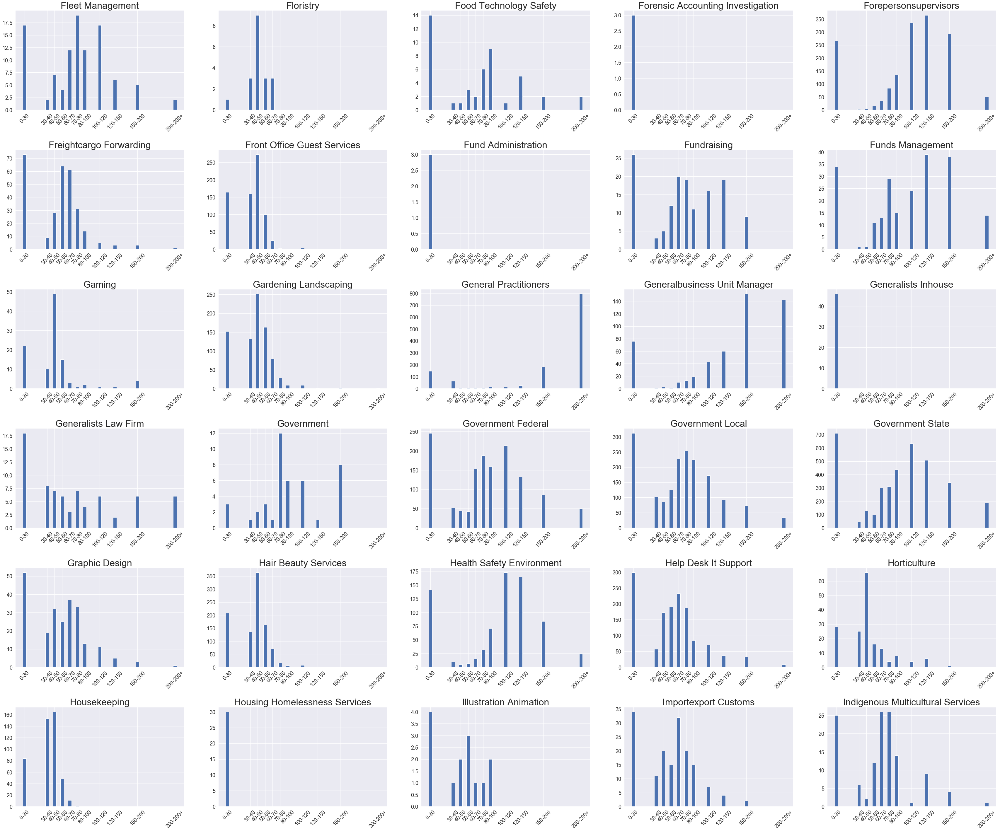

In [15]:
def subclass_distribution(no_rows, no_cols, subset):
    
    subclass_low_salary_freq = df.groupby('SubClassification')['LowestSalary'].value_counts(sort=False)
    subclass_high_salary_freq = df.groupby('SubClassification')['HighestSalary'].value_counts(sort=False)
    
    no_salaries = len(unique_low_salaries)
    subclass_distribution = {}
    set_start = subset*(no_rows*no_cols)
    set_end = (subset+1)*(no_rows*no_cols)
    fig, axs = plt.subplots(no_rows, no_cols, figsize=(60, 50))
    plt.subplots_adjust(hspace=0.4)
    plt.rcParams.update({'font.size': 20})
    ax_iter = iter(axs.flat)

    # i tracks the position of the salary range category
    i = 0
    old_key = ''

    for key, value in subclass_low_salary_freq.items():

        # Check if the key value has changed to reset the postion within the unique_low salaries list
        if key[0] != old_key:
            i = 0
            subclass_distribution[key[0]] = [0]*no_salaries

        # Append the frequency value of the subclass for the given salary
        if unique_low_salaries[i] == key[1]:
            if key[0] in subclass_distribution:
                subclass_distribution[key[0]][i] = value

        # Save the key to check on the next iteration
        old_key = key[0]
        i += 1

    for k, (key, value) in enumerate(subclass_distribution.items()):

        # Continue if the subset hasn't been reached
        if k < set_start:
            continue
            
        # Exit loop if at the end of the set
        if k == set_end:
            break
            
        # Create figures for each subclass within the set
        if k >= set_start:

            ax = next(ax_iter)
            ax.bar(unique_low_salaries, height=subclass_distribution[key], width=4.5, tick_label=salary_range_labels)
            ax.minorticks_off()
            ax.set_xticklabels(salary_range_labels, rotation=45)
            
            # Make each of the chart labels font size larger
            for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] + ax.get_xticklabels() + ax.get_yticklabels()):
                item.set_fontsize(18)
            ax.set_title(key.title(), fontsize=32)
            
    plt.show()
    
# Subset changes the set of subclass distributions that are shown. 0 = 0 -> 29, 1 = 30 -> 59 ...
# There are 338 subclasses, therefore 11 subsets
no_rows, no_cols, subset = 6, 5, 4
subclass_distribution(no_rows, no_cols, subset)

[['0' 'retail consumer products']
 ['1' 'call centre customer service']
 ['2' 'hospitality tourism']
 ['3' 'banking financial services']
 ['4' 'manufacturing transport logistics']
 ['5' 'sales']
 ['6' 'administration office support']
 ['7' 'trades services']
 ['8' 'accounting']
 ['9' 'real estate property']
 ['10' 'healthcare medical']
 ['11' 'marketing communications']
 ['12' 'government defence']
 ['13' 'information communication technology']
 ['14' 'education training']
 ['15' 'community services development']
 ['16' 'mining resources energy']
 ['17' 'human resources recruitment']
 ['18' 'insurance superannuation']
 ['19' 'engineering']
 ['20' 'ceo general management']
 ['21' 'design architecture']
 ['22' 'legal']
 ['23' 'construction']
 ['24' 'sport recreation']
 ['25' 'science technology']
 ['26' 'advertising arts media']
 ['27' 'farming animals conservation']
 ['28' 'self employment']
 ['29' 'consulting strategy']]


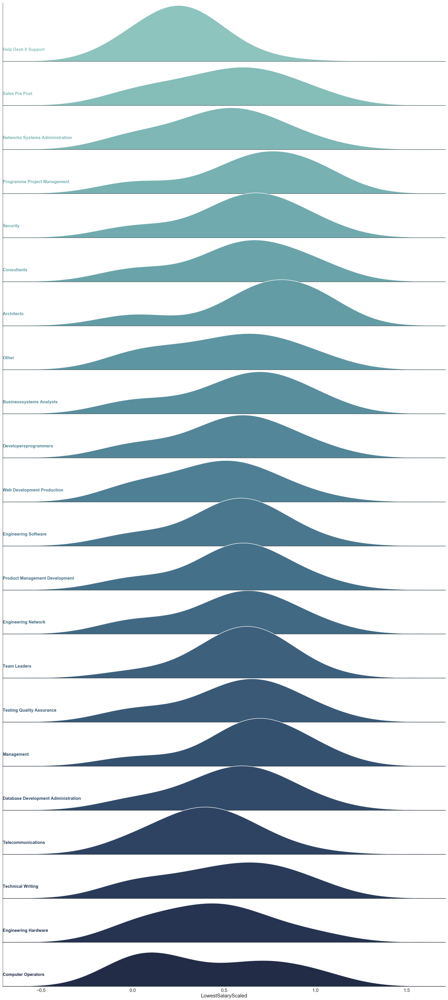

In [16]:
# Get list of classes
class_list = df['Classification'].unique()
sns.set(style="white", rc={"axes.facecolor": (0, 0, 0, 0)}, font_scale=2)

# Print the list of classes and their index
print(np.array([(i, v) for i, v in enumerate(list(class_list)) if str(v) != "nan"]))

def subclass_ridge_plot(first_class, last_class):
    """ Creates a ridge plot from the LowestSalaryScaled values for each sub-sector for the given sector.
    
    Description:
        The sub-sectors of a given sector are each plotted on their own row within a seaborn facetgrid. Each row is a 
        kde plot showing the salary distribution for the sub-sector. They're overlapping each other so there distributions may
        be more easily compared relative to the separate barcharts above.
    """
    
    # Get Sectors within the given range (usually 1)
    subclass_low_salary= df.loc[df['Classification'].isin(class_list[first_class:last_class])]
    subclass_low_salary["LowestSalaryScaled"] = subclass_low_salary["LowestSalaryScaled"].apply(lambda x: x*5)
    
    # Create blue gradient color palette
    pal = sns.cubehelix_palette(23, rot=-.3, light=.7)
    g = sns.FacetGrid(subclass_low_salary, row="SubClassification", hue="SubClassification", aspect=10, height=3, palette=pal)
    
    # Plot the coloured kde
    g.map(sns.kdeplot, "LowestSalaryScaled", clip_on=False, shade=True, alpha=1, lw=1.5, bw=.2)
    
    # Plot the kde behind the above kde so they're distingishable when overlapping
    g.map(sns.kdeplot, "LowestSalaryScaled", clip_on=False, color="w", lw=2, bw=.2)
    g.map(plt.axhline, y=0, lw=2, clip_on=False)

    # Define and use a simple function to label the plot in axes coordinates
    def label(x, color, label):
        ax = plt.gca()
        ax.text(0, .2, label.title(), fontweight="bold", color=color,
                ha="left", va="center", transform=ax.transAxes, fontsize=20)

    g.map(label, "LowestSalaryScaled")

    # Set the subplots to overlap
    g.fig.subplots_adjust(hspace=-.25)

    # Remove axes details that don't play well with overlap
    g.set_titles("")
    g.set(yticks=[])

sub_class = 13
subclass_ridge_plot(sub_class, sub_class+1)

## 2) Studying the Market by Locations

### What is the market size in each city? 

Looking at the market size of each city provides information on where the greatest number of opportunities are. More job opportunities means that you'll have more flexibility in what positions you're able to take in order to optimise your desired career path. Your career path likely can be taken further, as larger job markets have larger companies/organisations. Although it also means that there's likely more competition for those positions. 

The most suitable representation for this data is a horizontal bar graph since there's a large number of locations. The data is also sorted by it's frequency so it's clear as to the ranking relative to other locations. Furthermore, a pie chart was used to represent each city as one part of a whole. Showing each city's percentage contribution to the market share. Finally, the spatial data was used to create a bubble map, where each of the bubbles was placed at one of the examined locations and scaled relative to the location's market size. This data visualisation method makes the analysis intuitive for a regular viewer.

Our results show that Sydney has the largest market size, followed by Melbourne, Brisbane, Perth etc. Unsurprisingly, this is a similar order to the largest city populations in Australia. However, there are some exceptions. Gold Coast is ranked below the ACT and Newcastle yet it has a population size 200,000+ larger. This difference may correspond to greater population growth rates, as the job market is slow to catch up. Locations with higher rankings relative to their population size potentially would have less competition for positions making it easier to be hired. 

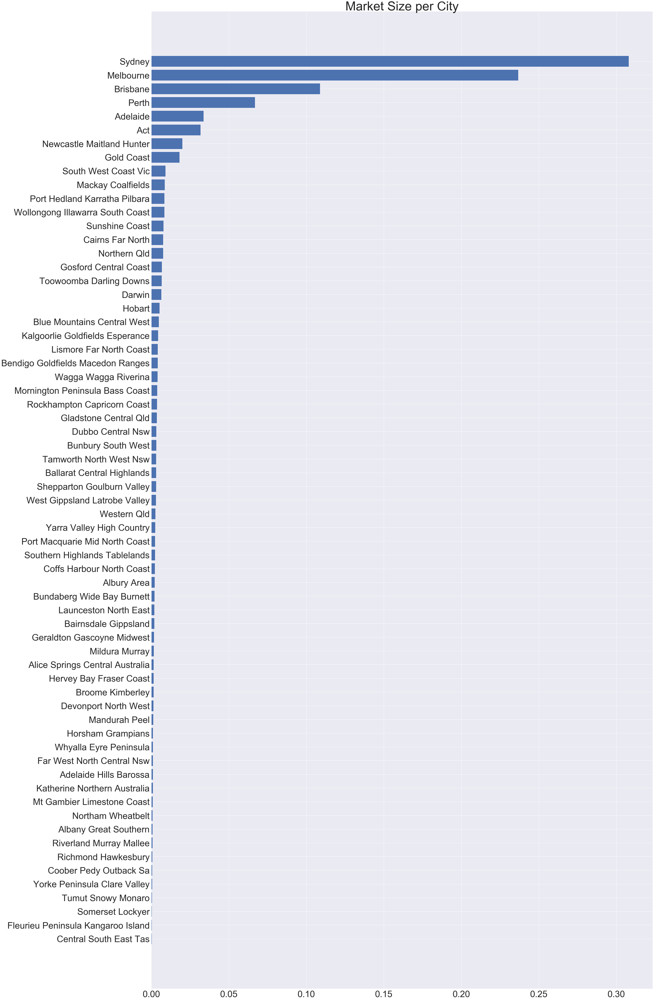

In [17]:
sns.set()

# Find the number of jobs in each city
query_df = spark_df.groupBy("Location").count().toPandas()
query_df.set_index("Location").to_dict()
location_freq = query_df.set_index("Location")["count"].to_dict()
location_freq.pop("nan", None)

# Calculate the total number of jobs from all locations
no_jobs = sum(list(location_freq.values()))
no_locations = len(location_freq)

# Normalise the location frequency
location_freq_percent : typing.List[typing.Tuple] = [(key, value/no_jobs) for key, value in location_freq.items()]

# Sort the locations from largest to smallest in terms of frequency
location_freq_percent = sorted(location_freq_percent, key=lambda x : x[1], reverse=False)

# Create horizontal bar chart
fig, ax = plt.subplots(figsize=(50, 100))
ax.barh(np.arange(no_locations), [x[1] for x in location_freq_percent], )
ax.set_yticks(np.arange(no_locations))
ax.set_yticklabels([x[0].title() for x in location_freq_percent])

# Set chart font size
for item in ([ax.title, ax.xaxis.label, ax.yaxis.label] +
             ax.get_xticklabels() + ax.get_yticklabels()):
    item.set_fontsize(50)
ax.set_title("Market Size per City", fontsize=70)

plt.show()

#### Pie chart analysis of the market size in each city

In [18]:
# Reset matplotlib display settings
mpl.rcParams.update(mpl.rcParamsDefault)

# Find the job listing counts of each city
query_df = spark_df.groupBy("Location").count().orderBy("count", ascending=False).toPandas()
query_df = query_df.drop(query_df.loc[query_df["Location"].str.match("nan")].index)
values = list(query_df["Location"])
counts = list(query_df["count"])

# Normailze counts into the range of 0-100%
s = sum(counts)
market_shares = [c/s for c in counts]

# Capitalise the titles of each city for visualisation
cities = [w.title() for w in values]

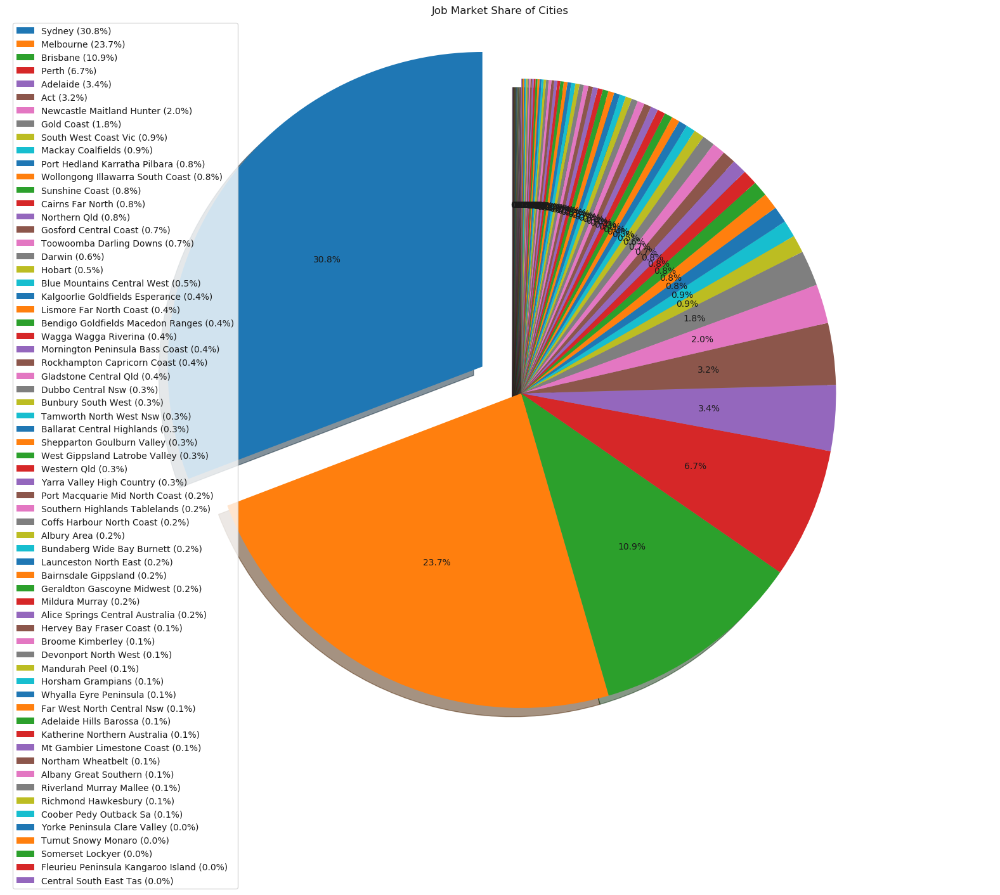

In [19]:
# Plot the sectors in order of their market share (counter-clockwise)
fig, ax = plt.subplots(figsize=(20, 15))
explode = [0.15 if i == 0 else 0.0 for i in range(len(cities))]
ax.pie(market_shares, explode=explode, autopct='%1.1f%%', shadow=True, startangle=90)
ax.axis('equal')

plt.legend(["{} ({:.1f}%)".format(cities[i], market_shares[i] * 100) for i in range(len(cities))], loc="best")
plt.title("Job Market Share of Cities")
plt.show()

In [20]:
# Save the pie chart data to a json file
json_pie_chart_marketshare_cities_list = []

for i in range(len(cities)):
    json_pie_chart_marketshare_cities_list.append({"city": cities[i].title(), "job_advertisement_count": counts[i]})
    
with open("json_pie_chart/marketshare_cities_pie_chart.json", "w") as fout:
    json.dump(json_pie_chart_marketshare_cities_list, fout)

#### Bubble map analysis of the market size in each city

In [21]:
# Find the job listing counts of each location
query_df = spark_df.groupBy("Location").count().orderBy("count", ascending=False).toPandas()
query_df = query_df.drop(query_df.loc[query_df["Location"].str.match("nan")].index)
values = query_df["Location"].tolist()
counts = query_df["count"].tolist()

# Normailze counts into the range of 0-100%
s = sum(counts)
market_shares = [c/s for c in counts]

# Capitalise the titles of each location for visualisation
locations = [w.title() for w in values]

In [22]:
# Find the corresponding latitudes and longitudes of the locations
located_locations = []
location_latitudes = []
location_longitudes = []
located_location_listing_count = []
located_location_market_shares = []

geolocator = Nominatim(user_agent='joshua_russell')

for i, location in enumerate(locations):
    loc = geolocator.geocode(location + ", Australia")
    
    # Only record data for locations whose latitude and longitude could be found
    if loc is not None:
        located_locations.append(location)
        location_latitudes.append(loc.latitude)
        location_longitudes.append(loc.longitude)
        located_location_listing_count.append(counts[i])
        located_location_market_shares.append(market_shares[i])

# Create a DataFrame to plot the circles on the map
data = pd.DataFrame({
    "lat": location_latitudes,
    "lon": location_longitudes,
    "location": located_locations,
    "market_share": located_location_market_shares,
    "listing_count": located_location_listing_count
})

In [23]:
# Create an empty map centered at Australia
m = folium.Map(location=[-25.2744, 133.7751], tiles="Mapbox Bright", zoom_start=4)
 
# Add circles at each location scaled to the market share of the particular location
for i in range(0, len(data)):
   folium.Circle(
      location=[float(data.iloc[i]["lat"]), float(data.iloc[i]["lon"])],
      popup=str("<strong>{}</strong> ({} Job Listings)".format(data.iloc[i]["location"], data.iloc[i]["listing_count"])),
      radius=float(data.iloc[i]["market_share"]*1000000),
      color='crimson',
      fill=True,
      fill_color='crimson'
   ).add_to(m)

# Display the map
m

In [24]:
# Save the map to a HTML file
m.save("Location-Market-Share-Map.html")

### Which are the hottest job sectors in each city?

The following analysis was conducted to determine which job sectors are the hottest in each city. This information will allow people living in the city to determine what would be the best career path to pursue. It would also allow people considering moving to Australia to determine what would be the best city to live in based upon their profession. For example, an ICT professional moving from America to Australia could see what cities have a significant number of ICT job listings and decide to move there. Furthermore, the information could be used by overseas companies to determine which city would be the best to build an office in, or by the government to see which ares need additional assistance, in say hospitality or healthcare. 

In order to determine the hottest job sectors in each city, we decided that a graphical analysis would be ideal. Moreover, since the data in question is compositional, static, and concerning a share of a total (i.e. the share of job sectors within a particular city) we came to the conclusion that the best visualisation method would be a pie chart. In regard to implementation, we gathered the job advertisement counts of each sector for all cities, normalised the counts into percentages, and then displayed the top 5 sectors for each city using a pie chart.

The results of this analysis showed that the *Information Communication Technology* sector is the hottest job sector in the main cities/locations of Australia (specifically, Sydney, Brisbane, Melbourne and the ACT). This can be expected as ICT companies are generally setup within the major CBDs of a country. In contrast, among the other cities (i.e. non-main cities), the most popular job sector was *Healthcare/Medical*. We also observed that the *Trades Services* sector was mostly within the top 3 most popular job sectors for each city, although rarely the most popular. Each city then had popular sectors depending on its niche. For example, Gold Coast's most popular sector was *Hospitality Tourism* and Perth's second hottest sector was *Mining Resources Energy*. 

An interesting observation was made in regard to the most popular sectors in each city. For context, we note that later on in the investigation we observed that the *Information Communication Technology* sector had the largest market share across Australia. However, in this analysis we observed that the vast majority of cities have the *Healthcare/Medical* sector as their most popular job advertisement sector. This alludes to the fact that the *Information Communication Technology* sector is predominant within a few number of cities, rather than across all the cities of Australia.

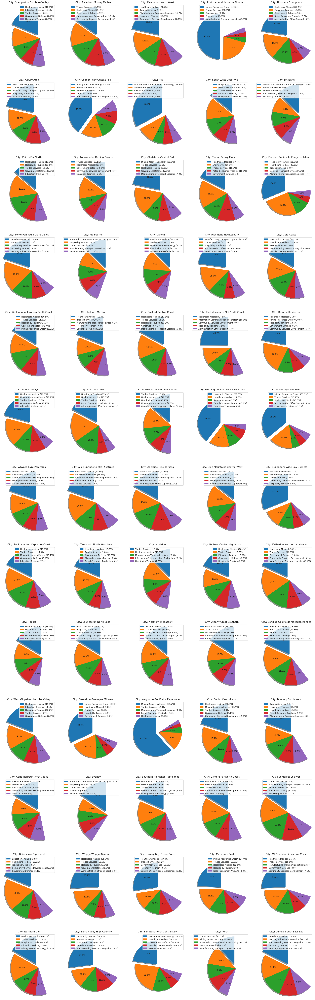

In [25]:
# Reset matplotlib display settings
mpl.rcParams.update(mpl.rcParamsDefault)

# Display options can be either "Graphical" or "Textual"
display = "Graphical"

query_df = sqlContext.sql("SELECT DISTINCT Location \
                           FROM job_listings").toPandas()

cities = [c for c in np.array(query_df["Location"]) if str(c) != "nan"]

city_top_job_sectors = {}
top_n = 5

for city in cities:
    
    # Find the job listing counts of each sector in the given city
    query_df = sqlContext.sql("SELECT Classification, COUNT(*) \
                               FROM job_listings \
                               WHERE Location='{}'\
                               GROUP BY Classification \
                               ORDER BY COUNT(*) DESC".format(city)).toPandas()
    
    sectors = query_df["Classification"].tolist()
    job_counts = query_df["count(1)"].tolist()
    
    # Normailze counts into the range of 0-100%
    s = sum(job_counts)
    sector_shares = [c/s for c in job_counts]
    
    # Find the top 5 sectors in the city
    top_sectors = [(sectors[i], sector_shares[i]) for i in range(len(sectors))]
    top_sectors = sorted(top_sectors, key=lambda x:x[1], reverse=True)
    top_sectors = top_sectors[:top_n]
    
    # Textual display 
    if display == "Textual":
        print("City: {}\n".format(city.title()))
        for sector in top_sectors:
            print("\t{:<40} {:.1f}%".format(sector[0].title(), sector[1]*100))
        print()
    
    # Graphical display
    if display == "Graphical":
        city_top_job_sectors[city] = top_sectors
    
# Graphical display
if display == "Graphical":
    
    i = 0
    fig, ax = plt.subplots(nrows=13, ncols=5, figsize=(28, 90))

    for row in ax:
        for col in row:
            
            city = cities[i]
            sectors = [s[0] for s in city_top_job_sectors[city]]
            sector_shares = [s[1] for s in city_top_job_sectors[city]]
            
            sectors = [w.title() for w in sectors]
            
            # Explode hottest job sector in the city
            explode = [0.15 if i == 0 else 0.0 for i in range(len(sector_shares))]
            col.pie(sector_shares, explode=explode, autopct='%1.1f%%', shadow=True, startangle=90)
            col.axis('equal')
            col.set_title("City: {}".format(city.title()))
            col.legend(["{} ({:.1f}%)".format(sectors[i], sector_shares[i] * 100) for i in 
                        range(len(sectors))], loc="upper right")
            
            i += 1
    plt.show()

### Which range of salary is common in each city? 

In [26]:
# Get the frequency of salary per location
location_salary_range = df.groupby("Location")["LowestSalary"].value_counts()
location_salary_range_mode = {}

no_top_salaries = 2
old_key = ''
i = 0

for key, value in location_salary_range.items():
    
    if key[0] != old_key and i > no_top_salaries:
        i = 0
    if i < no_top_salaries:
        if key[0] != old_key:

            if old_key != '':
                
                # Print out the locations values after the key changes to avoid looping through later
                print(F'{old_key.title()}: \n1st Salary : {location_salary_range_mode[old_key][0][0]} - '
                      F'{location_salary_range_mode[old_key][0][1]} \n' 

                      F'2nd Salary : {location_salary_range_mode[old_key][1][0]} - '
                      F'{location_salary_range_mode[old_key][1][1]} \n' ) 
                
            # Set up new key's list
            location_salary_range_mode[key[0]] = []
        
        # Append the key's salary value
        location_salary_range_mode[key[0]].append((key[1], value))

    i += 1
    old_key = key[0]

Act: 
1st Salary : 0 - 1071 
2nd Salary : 150 - 976 

Adelaide: 
1st Salary : 0 - 1256 
2nd Salary : 40 - 1007 

Adelaide Hills Barossa: 
1st Salary : 0 - 45 
2nd Salary : 40 - 37 

Albany Great Southern: 
1st Salary : 0 - 34 
2nd Salary : 40 - 21 

Albury Area: 
1st Salary : 0 - 78 
2nd Salary : 40 - 64 

Alice Springs Central Australia: 
1st Salary : 0 - 54 
2nd Salary : 70 - 44 

Bairnsdale Gippsland: 
1st Salary : 0 - 68 
2nd Salary : 40 - 50 

Ballarat Central Highlands: 
1st Salary : 0 - 119 
2nd Salary : 40 - 84 

Bendigo Goldfields Macedon Ranges: 
1st Salary : 0 - 143 
2nd Salary : 30 - 136 

Blue Mountains Central West: 
1st Salary : 0 - 162 
2nd Salary : 30 - 151 

Brisbane: 
1st Salary : 0 - 4082 
2nd Salary : 40 - 2734 

Broome Kimberley: 
1st Salary : 0 - 61 
2nd Salary : 100 - 32 

Bunbury South West: 
1st Salary : 0 - 127 
2nd Salary : 40 - 87 

Bundaberg Wide Bay Burnett: 
1st Salary : 0 - 80 
2nd Salary : 40 - 69 

Cairns Far North: 
1st Salary : 0 - 330 
2nd Salary :

### Where are the employees more wellpaid? 

To find the answer to this question, the average salary per city is a good measure for ranking each of the cities because the salary column is cardinal, and it provides the centre of the distribution while not blowing out as the number of job postings increases. The cities are ranked according to their average and shown within a vilolin and box and whisker plot. 
These charts give further insight into the the city's salary distribution. 

The average salary of locations is calculated using the HighestSalary column so as not to be thrown off by the LowestSalary being equal to 0 which wouldn't contribute. A subset of that list is then used to plot the data. 

Remarkably our results show that the ACT is the most wellpaid location with widespread distribution of salaries. The ACT doesn't have near the largest population in Australia but it has a relatively higher skew of salary distribution. The difference between cities is small and isn't desernible until the far ends of the order. Although, we can see that the skew of the data tends to move towards the lower salaries as you go further down the rankings, while the 2nd and 3rd quartiles contract. Also, outliers become more frequent and the range slowly decreases. As expected, the locations with higher rankings also have a greater number of positions in sectors like Information Communication Technology and Healthcare Medical according the the sector composition pie charts above. 

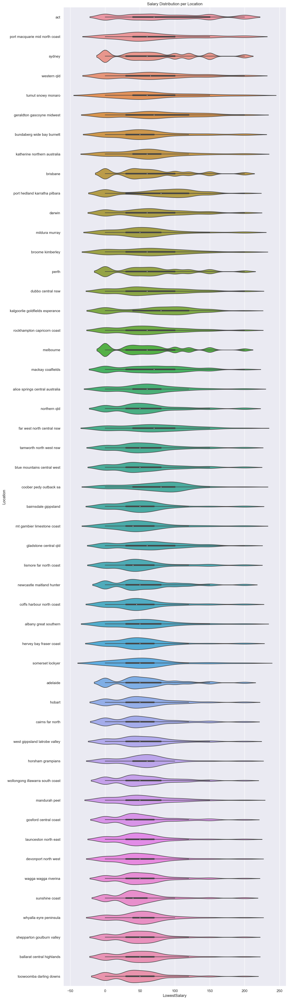

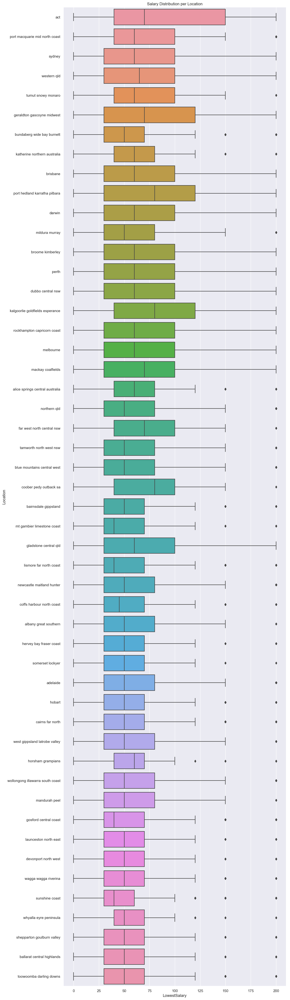

In [27]:
# Reset matplotlib display settings
mpl.rcParams.update(mpl.rcParamsDefault)
sns.set()

no_included_locations = 50

# Get the average salary per location to order each of the locations in the graph
query_df = sqlContext.sql("SELECT Location, AVG(HighestSalary) \
                           FROM job_listings \
                           GROUP BY Location \
                           ORDER BY Location").toPandas()
query_df = query_df.drop(query_df.loc[query_df["Location"].str.match("nan")].index)

df_salary_average = query_df.set_index("Location").T.iloc[0]
df_salary_average = df_salary_average.sort_values(ascending=False)

# Display only the first set of locations with the greatest mean
location_list = df_salary_average.iloc[0:no_included_locations].keys()
Locations = df.loc[df['Location'].isin(location_list)]

# Create violin plot of the distributions
fig, ax = plt.subplots(figsize=(12, no_included_locations+3))
sns.violinplot(ax=ax, y='Location', x='LowestSalary', order=df_salary_average[:no_included_locations].index, 
               data=Locations , alpha=0.5)
ax.set_title('Salary Distribution per Location')

# Create box plot variation of previous violin plot
fig, ax = plt.subplots(figsize=(12, no_included_locations+3))
sns.boxplot(ax=ax, y='Location', x='LowestSalary', order=df_salary_average[:no_included_locations].index, data=Locations)
ax.set_title('Salary Distribution per Location')

plt.show()

### Has salary changed over the 6 months

Here we examine the trend of salary over the 6 months of data that was collected. We're able to show different aspects of how salary has changed over time including the mean, median, standard deviation and variance. For instance, by taking the mean over time, we don't take into account the number of job postings and isolate the salary itself. On the otherhand, median allows us to see the change in most common salary and standard deviation allows us to see the spread of salaries at any given time. From this information, we can determine how the general overall salary is changing in Australia, what the largest portion of people are being paid and the disparity between high and low incomes over time. This can give us insight into how Australia's economy has changed over the 6 months from the perspective of the job market. By plotting the regression we can deduce if the economy is improving or declining. 

Firstly, to graph the salary over time we needed to place the date in the correct, increasing order. This was done by converting the date column to a datetime type and grouping the salaries with each of the dates. A function is used to calculate some measure (mean, median, standard deviation) of each date to produce the final line graph. Analysing changes over time is most suitable to line graphs as data is structured so that points occur consecutively. 

Our results show a slight decline in the overall job salary over the 6 months. The largest peak is around December of 2018 with an average salary of \\$160,000+, followed by a period of low peaks of \\$0 - \\$30,000 corresponding to relatively low standard deviation. This is an interesting finding and may be due to companies hiring large amounts of people for the New Year and over the Christmas holidays. Generally we also see large spikes on certain days that could be the result of large companies releasing new positions at the same time. For example, Coles hiring people periodically across multiple locations. Later when looking at which companies post most frequently, we also see the other job search websites like Jora Local post their own listings on SEEK. Consequently this could also be the cause for the large spikes.
To improve our results and gain further insight we would need to collect data over a longer period. Collecting over a longer period will improve reliability and reduce the impact of noise on our results. 

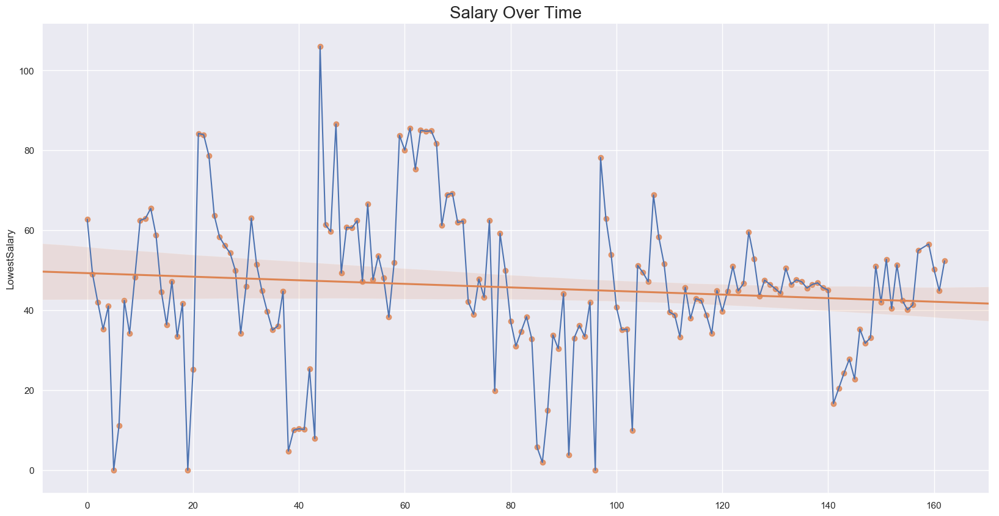

In [28]:
# Plot the salary over each date from every class and location
plt.figure(figsize=(20,10))

# Get list of classes
class_list = df['Classification'].unique()

# Select the rows with the locations within the specified range
dates = df.loc[df['Classification'].isin(class_list)]

# Assign each date a label for graphing
date_labels, unique_dates = pd.factorize(df["Date"])

# Convert Date series to datetime type so that they may be sorted correctly
dates["Date"] = pd.to_datetime(dates["Date"])

# Operations: mean, median, sum, std, min, max, var
date_class = dates.groupby(["Date"])["LowestSalary"].std().reset_index(name="LowestSalary")
date_labels, unique_dates = pd.factorize(date_class["Date"])

# Line plot, with salary over date, with subset of classes 
ax = sns.lineplot(x=date_labels, y="LowestSalary", data=date_class)

# Regression plot to show the trend of the lineplot
ax = sns.regplot(x=date_labels, y="LowestSalary", data=date_class)
ax.set_title("Salary Over Time", fontsize=20)

plt.show()

In [29]:
# Save mean salary over time data to json file
json_mean_salary_over_time_chart_list = []
for i in range(len(date_class)):
    json_mean_salary_over_time_chart_list.append({"date": str(date_class["Date"][i])[:10], 
                                                  "job_advertisement_count": date_class["LowestSalary"][i]})
with open("json_graph/json_mean_salary_over_time_chart.json", "w+") as fout:
    json.dump(json_mean_salary_over_time_chart_list, fout)

#### Regressions

Now we break up the salary over time into different sectors/locations so that we may make comparisons between them. Comparing how different job sectors/locations are performing allows us to determine which sectors will be most profitable in the future by extrapolating trends. Therefore, we can be proactive about the sectors we decide to enter by providing recommendations on those to avoid and those to pursue. 

Each sector/location is plotted within the same graph so that there trajectories can be closely compared. A range of sectors is choosen from the dataset to graph for comparison and an operation (mean, median, standard deviation) is again applied for each sector with the same date. 

Depending on the sectors selected, patterns can vary dramatically. Interestingly, some sectors follow very similar trajectories while others meander on their own. For example, the information and communication technology, human resources recruitment and mining resources energy sectors have low distances between them along their trajectories, while the community services development and education training sectors usually have smaller values at greater distances. Differences also occur in the patterns between groups of sectors like those mentioned above. This is an indication that some sectors can be clustered together by their similarity. The same behaviour can also be seen for each of the locations. Those with similar characteristics, like population and distribution, also have similar trajectories.

The regression line plotted gives an indication of how well a given sector or location is performing and the degree that they're increasing or declining in their demand and thus relevancy in today's market. Looking at longer term data would mean that a more reliable and accurate measure can be used to recommend sectors or locations that have prosperous futures and those that don't. Increasing or declining demand for a sector may be the result of improving technology, changing regulations etc. Locations may be affected by their sector composition and locality to other well performing locations. Those which thrive introduce and invest in growing sectors while diversifying and balancing. Our results show that sectors like farming animals conservation and manufacturing transport logistics have a negative trend while ICT is trending positively. Sydney is trending positively and as we see later, it has a large share of growing sectors

[['0' 'retail consumer products']
 ['1' 'call centre customer service']
 ['2' 'hospitality tourism']
 ['3' 'banking financial services']
 ['4' 'manufacturing transport logistics']
 ['5' 'sales']
 ['6' 'administration office support']
 ['7' 'trades services']
 ['8' 'accounting']
 ['9' 'real estate property']
 ['10' 'healthcare medical']
 ['11' 'marketing communications']
 ['12' 'government defence']
 ['13' 'information communication technology']
 ['14' 'education training']
 ['15' 'community services development']
 ['16' 'mining resources energy']
 ['17' 'human resources recruitment']
 ['18' 'insurance superannuation']
 ['19' 'engineering']
 ['20' 'ceo general management']
 ['21' 'design architecture']
 ['22' 'legal']
 ['23' 'construction']
 ['24' 'sport recreation']
 ['25' 'science technology']
 ['26' 'advertising arts media']
 ['27' 'farming animals conservation']
 ['28' 'self employment']
 ['29' 'consulting strategy']]


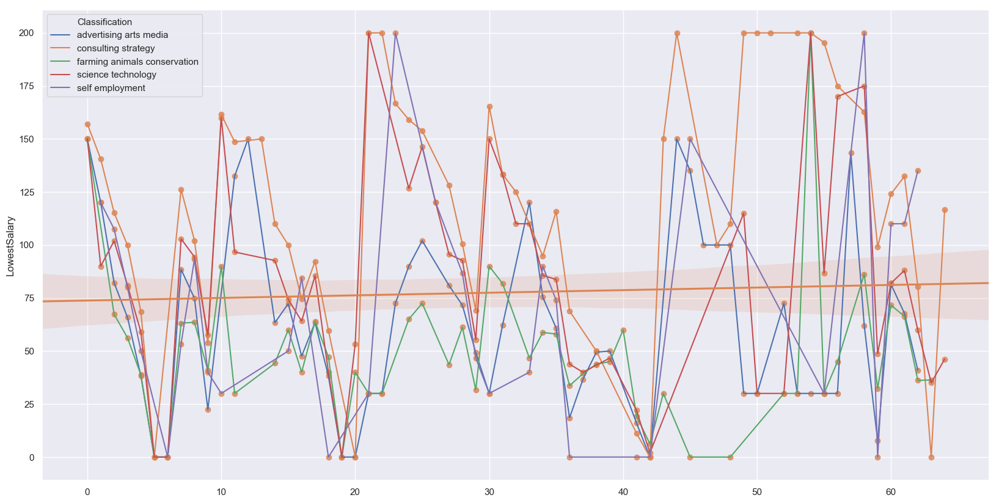

In [30]:
plt.figure(figsize=(20,10))

# Get list of classes
class_list = df['Classification'].unique()

# Print the list of classes and their index
print(np.array([(i, v) for i, v in enumerate(list(class_list)) if str(v) != "nan"]))

# Range of classes to plot
first_class = 25
last_class = first_class + 5

# Select the rows with the locations within the specified range
dates = df.loc[df['Classification'].isin(class_list[first_class:last_class])]

# Convert dates to datetime type so that they may be sorted correctly
dates["Date"] = pd.to_datetime(dates["Date"])

# Operations: mean, median, sum, std, min, max, var
date_class = dates.groupby(["Date", "Classification"])["LowestSalary"].mean().reset_index(name="LowestSalary")

# Enumerate each date for labeling the graph
date_labels, unique_dates = pd.factorize(date_class["Date"])

# Line plot, with salary over date, with subset of classes 
ax = sns.lineplot(x=date_labels, y="LowestSalary", hue="Classification", data=date_class)

# Regression plot to show the trend of the lineplot
ax = sns.regplot(x=date_labels, y="LowestSalary", data=date_class)

plt.show()

[['0' 'sydney']
 ['1' 'richmond hawkesbury']
 ['2' 'brisbane']
 ['3' 'gosford central coast']
 ['4' 'adelaide']
 ['5' 'melbourne']
 ['6' 'perth']
 ['7' 'mackay coalfields']
 ['8' 'sunshine coast']
 ['9' 'gold coast']
 ['10' 'west gippsland latrobe valley']
 ['11' 'hervey bay fraser coast']
 ['12' 'south west coast vic']
 ['13' 'mornington peninsula bass coast']
 ['14' 'port hedland karratha pilbara']
 ['15' 'ballarat central highlands']
 ['16' 'bendigo goldfields macedon ranges']
 ['17' 'yarra valley high country']
 ['18' 'coffs harbour north coast']
 ['19' 'newcastle maitland hunter']
 ['20' 'tumut snowy monaro']
 ['21' 'darwin']
 ['22' 'toowoomba darling downs']
 ['23' 'act']
 ['24' 'wollongong illawarra south coast']
 ['25' 'port macquarie mid north coast']
 ['26' 'southern highlands tablelands']
 ['27' 'albury area']
 ['28' 'yorke peninsula clare valley']
 ['29' 'kalgoorlie goldfields esperance']
 ['30' 'far west north central nsw']
 ['31' 'cairns far north']
 ['32' 'wagga wagga ri

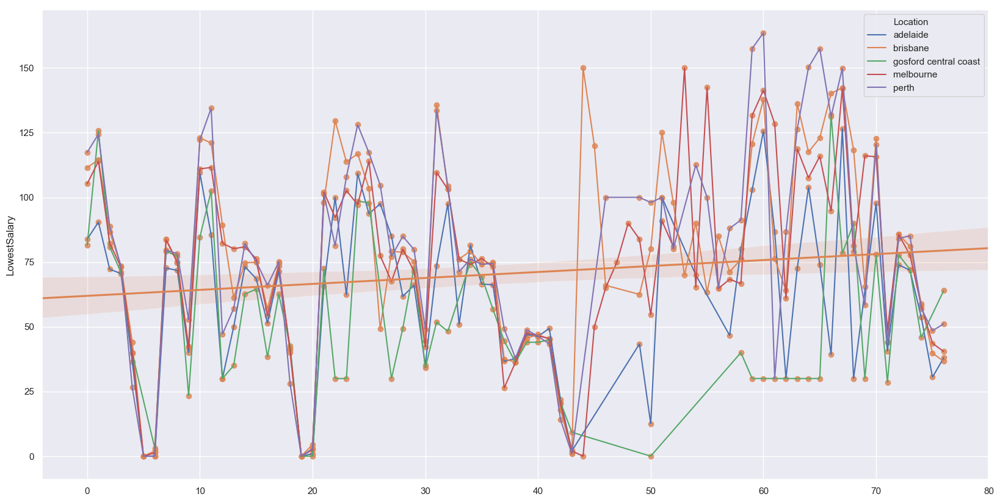

In [31]:
plt.figure(figsize=(20,10))

# Assign each date a label for graphing
# Get list of classes
location_list = df['Location'].unique()

# Print the list of Locations and their index
print(np.array([(i, v) for i, v in enumerate(list(location_list)) if str(v) != "nan"]))

# Specify range of Locations to plot
first_loc = 2
last_loc = first_loc + 5

# Select the rows with the locations within the specified range
dates = df.loc[df['Location'].isin(location_list[first_loc : last_loc])]

# Convert dates to datetime type so that they may be sorted correctly
dates["Date"] = pd.to_datetime(dates["Date"])

# Operations: mean, median, sum, std, min, max, var
date_class = dates.groupby(["Date", "Location"])["LowestSalary"].mean().reset_index(name="LowestSalary")

# Enumerate each date for labeling the graph
date_labels, unique_dates = pd.factorize(date_class["Date"])

# Line plot, with salary over date, with subset of locations
ax = sns.lineplot(x=date_labels, y="LowestSalary", hue="Location", data=date_class)

# Regression plot to show the trend of the lineplot
ax = sns.regplot(x=date_labels, y="LowestSalary", data=date_class)

plt.show()

### Detecting the pattern of job posting

The pattern of job posting is an important source of information to uncover and understand as finding a job is often partly being in the right place at the right time to submit an application. Knowing when jobs are generally posted can be helpful to know when to prepare sooner and find jobs on time. 

The dates are split into lists of ints and passed to Python's datetime functions to bin each one into the correct weekday, month or week of the year they belong to. Histograms were most appropriate because we're trying to get a general idea of patterns occuring at different times.

We see that as expected, the weekdays have the most number of job posts, averaging 61,182.6, with Wednesday as the most common overall. The average of weekdays and weekend days however differs by 50,651.6. Weekdays differ at most by 14,663, which was between Monday and Wednesday. 
Interestingly, the months graph shows a decline in a staccato like fashion in the number of job posts from October to March. 
Months December and January show an uptick of around 30,000 compared to November, likely because of the Christmas and holiday  hiring period. Even more interesting is the decline in job postings in March down to 402 and large increase in October to 113,782. October may be the Month when most companies post job listings so that they can have time to prepare for people to start working the following year and March is after when they've already hired for the year. We cannot be completely certain as we don't have a years worth of data to draw the whole seasonal period from to determine if this is an anomoly or not. The weeks of the year graph shows a vague pattern of jobs being posted within the first or second week of each month. The only exception being October where the largest peak is in the 3rd week. One issue we found with the data is that dates starting from January don't have Classification or Location values, reducing the reliability of the data for specific classifications and locations. Next we continue our analysis by looking into the trend and seasonality of the weeks of the year data.

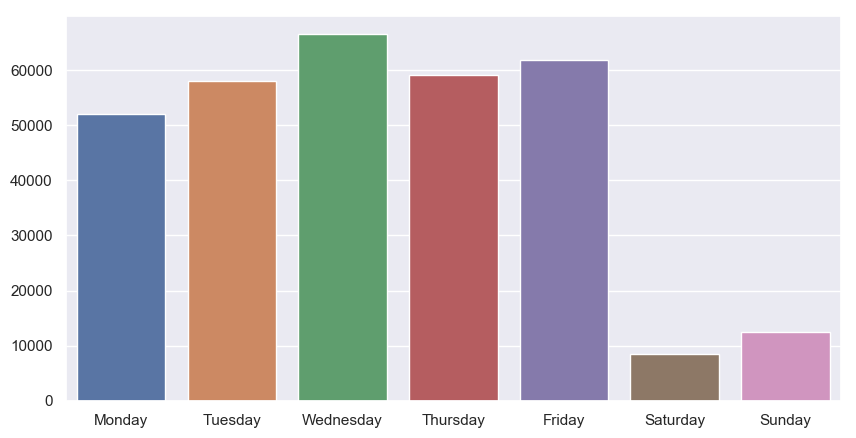

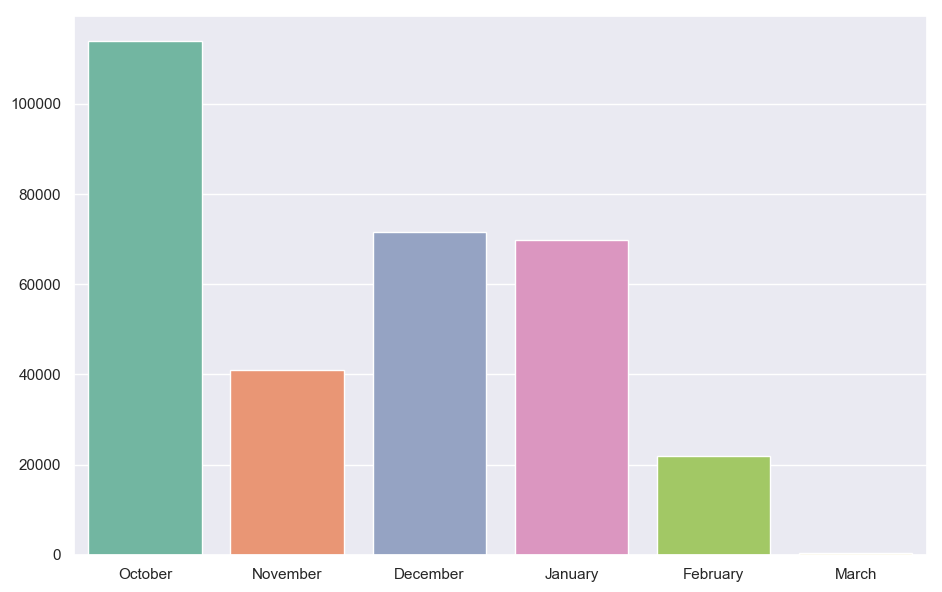

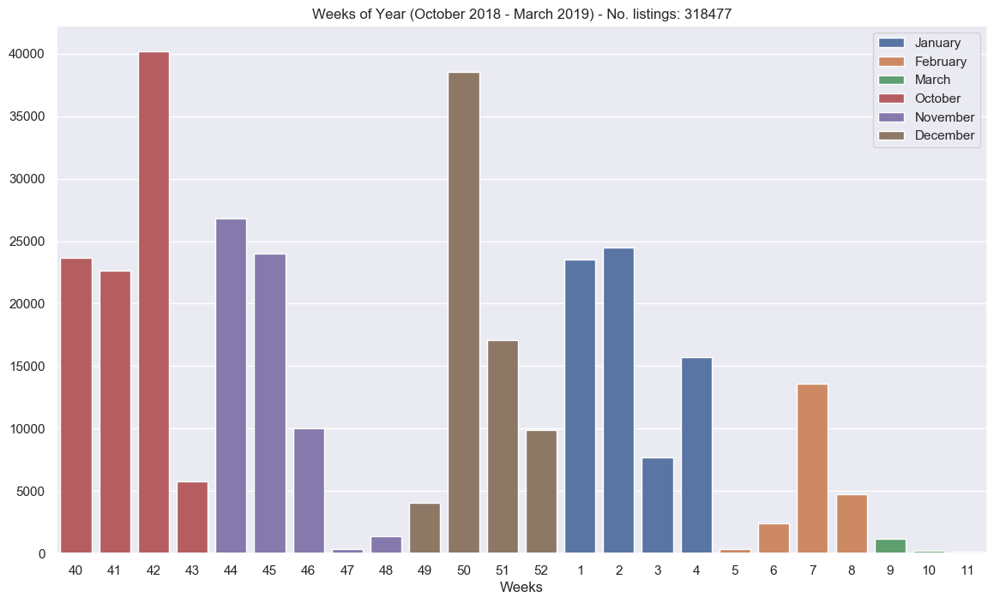

In [32]:
plt.rcParams.update({'font.size': 10})

def extract_date_lists():
    """ Splits the date into a lists and bins depending on respective weekday/month/week of year/week within month.
    
    Description:
        Each date is split into a list of ints so that they can be passed to the datetime.date function.
        
        Firstly, the weekday of the date is returned from date.weekday() as an integer and placed into the 
        the list at that index and the index's value is increased by the dates frequency. 
        
        Next, simply the second list (month) element is used to increase index's value by the current date frequency
        
        For weeks[] the week of the year is returned from isocalender within int value between 0 -> 51
        
        Finally, a label is assigned for the month that each week of the year belongs too
        
    return:
        weekdays, months, weeks, weeks_month
    """
    
    # Initialise variable lists to include all weekdays, months, weeks of year
    weekdays = [0]*7
    months = [0]*6
    weeks = [0]*52
    weeks_month = [0]*52

    # For each date in dataframe get the date and it's frequency
    for day, no_job_posts in df['Date'].value_counts().items():

        # Place day into a list and set them as ints
        current_day = day.split('-')
        current_day = list(map(int, current_day))

        # Assign each day to the day of the week it belongs to, summing frequency respectfully
        weekdays[date(current_day[0], current_day[1], current_day[2]).weekday()] += no_job_posts

        # Assign each day to the month in belongs, summing the frequency respectfully
        months[current_day[1]-7] += no_job_posts

        # Assign each day to the week of the year it belongs to, summing frequency respecfully
        weeks[date(current_day[0], current_day[1], current_day[2]).isocalendar()[1] -1] += no_job_posts

        # Assign each week of the year to the month is belongs to 
        weeks_month[date(current_day[0], current_day[1], current_day[2]).isocalendar()[1] -1] = current_day[1]
    
    return weekdays, months, weeks, weeks_month

weekdays, months, weeks, weeks_month = extract_date_lists()
weekDayAverage, weekEndAverage = 0, 0
for i in range(6):
    weekDayAverage += weekdays[i]
weekDayAverage = weekDayAverage / 5

for i in range(2):
    weekEndAverage += weekdays[i+5]
weekEndAverage = weekEndAverage / 2

#######################################################################

# Plot frequency per days of the week
fig, ax = plt.subplots(figsize=(10, 5))
sns.barplot(ax=ax, x=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'], y=weekdays)

#######################################################################

# Plot frequency per month
fig, ax = plt.subplots(figsize=(11, 7))

months_str = ['October', 'November', 'December', 'January', 'February', 'March' ]
months[:3], months[3:] = months[3:], months[:3]
sns.barplot(ax=ax, x=months_str, y=months, palette="Set2")

#######################################################################

# Plot frequency per week of the year
fig, ax = plt.subplots(figsize=(14, 8))
weeks_range =  [i for j in (range(40, 53), range(1, 12)) for i in j]

weeks[:13], weeks[41:52] = weeks[39:52], weeks[:11]
weeks_month[:13], weeks_month[41:52] = weeks_month[39:52], weeks_month[:11]

del weeks_month[13:41]
del weeks[13:41]

colour = sns.barplot(ax=ax, x=weeks_range, y=weeks, order=weeks_range, hue=weeks_month, dodge=False)

L=ax.legend()
months_str = ['January', 'February', 'March', 'October', 'November', 'December']
for i in range(6):
    L.get_texts()[i].set_text(months_str[i])

ax.set(title=f'Weeks of Year (October 2018 - March 2019) - No. listings: {df["Date"].count()}', xlabel='Weeks')
       
plt.show()

#### Breaking frequency up into trend, seasonality and residual/noise graphs

When analysising time series information it's useful to split the data into systematic (level, trend, seasonality) and non-systematic (residual) parts so that we can clearly see patterns occuring over time. The level is calculated with the local mean, providing a base of where to centre each of the graphs. The trend indicates the longer term growth or decline of the series and seasonality uncovers reoccuring periodic patterns with a given period/interval. 

Here we use the statsmodel decompose function implementation, which uses a moving average method. 

Again, the trend moves in a trigonomic manner from the peak of October down to the valley of November, coming back up for December and January and finally, falling back down linearly until March. Drawing from this limited data we can see a reoccuring pattern in the trend that repeats every 3 months. Using the optimal seasonlity period of 6, a repeating downward moving, three step pattern occurs every 2 months. 

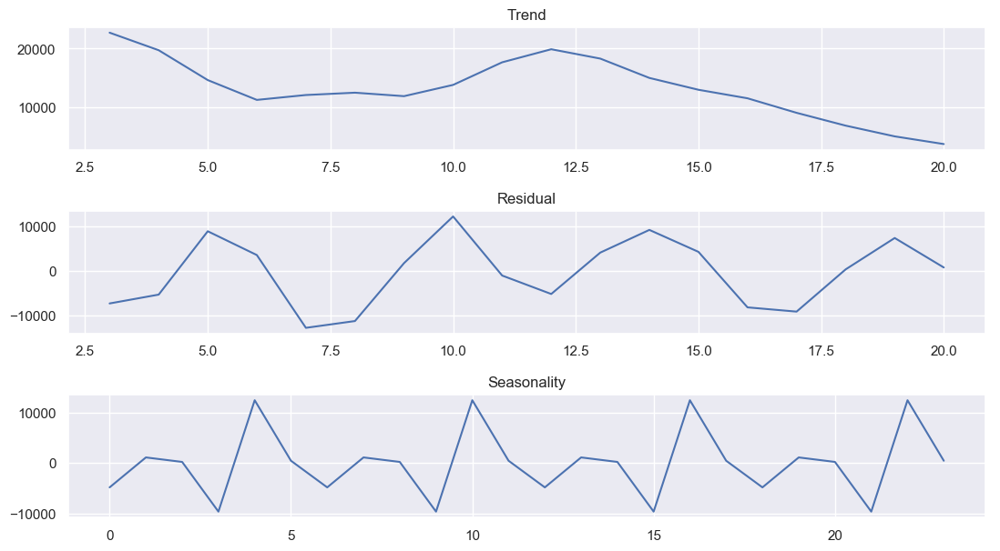

In [33]:
# Weeks_tuple 
wkdf = pd.DataFrame.from_dict({"freq": weeks})

# Break the frequency up into Trend, Seasonal and Risidual graphs
fig, (ax1,ax2,ax3) = plt.subplots(3,1, figsize=(13,7))
plt.subplots_adjust(hspace=0.5)

decomposition = seasonal_decompose(wkdf['freq'], model='additive', freq=6)
decomposition.trend.plot(ax=ax1, title="Trend")
decomposition.seasonal.plot(ax=ax3, title="Seasonality")
decomposition.resid.plot(ax=ax2, title="Residual")

plt.show()

Using the weeks of the year date from the previous few cells we use the Holt Winters exponential smoothing method to make predictions about how the frequency of job posts will continue into the future. Forecasting helps to inform scheduling/planning decisions to minimise the impact of future events by estimating the future using historial trends, seasonality and local mean etc. Our predictions can inform people as to whether they should be preparing to apply for positions at this point in time or not.

Our forecasting code uses the statsmodels implementation of the Holt Winters exponential smoothing function. To make accurate and reliable predictions we need to optimise the parameters that are used to train the model. Those paramerters include alpha : smoothing_level, beta : smoothing_slope, gamma: smoothing_season etc. These parameters can be set manually or simply optimised automatically. One parameter that needs to be manually optimised is the seasonal period which is the interval size of repeating seasonal patterns. Here each seasonal period's accuracy is measured using the root mean square error and the period with minimal error is selected for plotting. When training the model, we split the dataset into training and testing partitions to determine the model accuracy to unseen data. This split trys to optimise the amount of data the model is allowed to fit to while retaining enough data to have a good indication of the models generalised performance.

The results of our predictions continue beyond March to May. Making predictions further into the future will drastically reduce accuracy. The plot shows the difference between the predictions and the actual data. The accuracy of predictions is consistent until reaching the test data. Although the data does follow the general trend of the historical data, taking into account seasonality, there's room for improvement as the minimal error is 8175 for a seasonal period of 6. In order to improve, more data and or more sophisticated methods are required to get a better general fit to the data generating process. Our predictions show a low trend of job posting over the next few months

Seasonal period with minimum error: 6


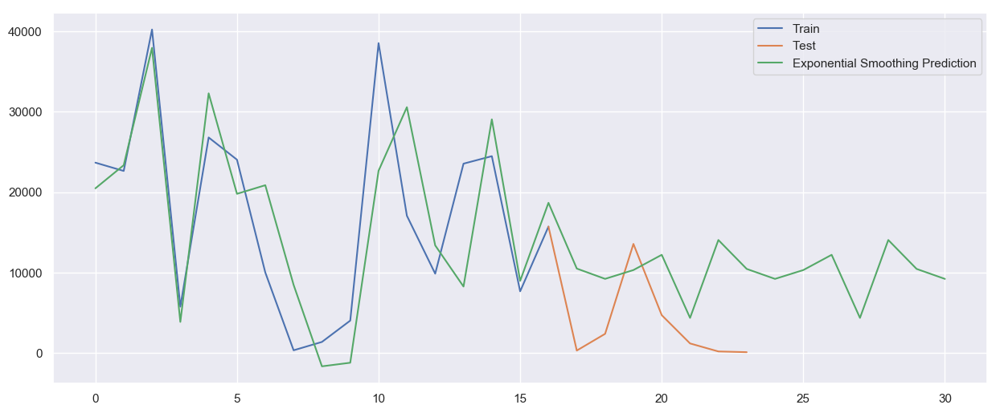

In [34]:
split_point = 17
train, test = wkdf['freq'].iloc[:split_point], wkdf['freq'].iloc[split_point-1:]

def error(actual, pred):
    return sqrt(mean_squared_error(actual, pred))

@memory.cache
def optimise_season_periods(actual):
    """ Finds the seasonal period with the minimal root square error relative to the weeks[] frequency list
    
    Description:
        Using the statsmodels ExponentialSmoothing function, each root mean square error 
        is computed the seasonal periods. When the model is fit, the alpha (smoothing_level), beta (smoothing_slope)
        etc. are optimized as well. The default, trend:additive, seasonal:multiply as used.
        
    Params:
        The data to fit the model to.
    
    return:
        The optimal seasonal period for the given data.
    """
    
    min_error = (-1, 100000)
    for i in range(2, 9):
        
        # Fit the model
        # Dampen reduce the size of trend over future time steps down to a straight line
        # Trend can be linear:additive, non-linear:multiplicative. alpha, beta control the influence on trend
        exp_model = ExponentialSmoothing(train, trend='add', seasonal='mul',  
                                         damped=True, seasonal_periods=i).fit(optimized=True, remove_bias=True)
        
        # Get predictions for start of test to the end
        pred = exp_model.predict(start=actual.index[0], end=actual.index[-1])#test.index[-1])
        
        # Calulate the error
        season_periods_error = error(actual, pred)
        # print(season_periods_error, i)
        
        if season_periods_error < min_error[1]:
            
            # Track min error and associated period
            min_error = (i, season_periods_error)
            
    return min_error

min_error = optimise_season_periods(test)
print(f'Seasonal period with minimum error: {min_error[0]}')

# Use the optimal seasonal period to fit the model and plot
exp_model = ExponentialSmoothing(train, trend='add', seasonal='mul',  
                                 damped=True, seasonal_periods=min_error[0]).fit(optimized=True, remove_bias=True)

# Make model predictions from start of data to specified end.
pred = exp_model.predict(start=0, end=30)#test.index[-1])

plt.figure(figsize=(15,6))
plt.plot(train.index, train, label='Train',)
plt.plot(test.index, test, label='Test')
plt.plot(pred.index, pred, label='Exponential Smoothing Prediction')

plt.legend(loc='best')

plt.show()

## 3) Studying the Market by Sectors

### Which sectors keep the highest market share? 

This analysis examined which sectors held the highest market share. Knowing which sectors make up the majority of the market share is important for understanding the current trends and demands for jobs within professions. High school students can use the information to determine what to study at university so that they are confident there will be a job for them after they graduate. Companies can use the information to determine how they should skew their business services to cater for the current demand. The government can use the information to see what job sectors are worth supporting, and which sectors could benefit from initiatives or additional teaching programs. For example, if there was a significant demand for ICT jobs, then the government could start coding classes in high schools, or if there was a significant demand for legal jobs, then the government could support mooting competitions for high school students to get them interested in the profession.   

Analysing the market share among a set number of sectors involves determing each sector's share of the total. This kind of compositional analysis is best represented through a pie chart. Consequently, we determined the job listing count of each sector from the dataset, then converted the counts into a percentage representation, and subsequently created a pie chart showing the percentage market share of all sectors. 

The results of this analysis showed that the sector with the most market share, and thus the trending sector in the market, was *Information Communication Technology*, followed by *Trades Services* and then *Healthcare Medical*. This shows that there is a high demand for jobs within these sectors. Thus, a suggestion based on statistical reasoning could be made to high school students stating that studying an ICT-related degree in university would be beneficial for their career and in job seeking. The sectors making up the least amount of the market share were *Self Employment*, *Advertising Arts Media*, and interestingly, *Ceo General Management*. We can therefore conclude that general management and CEO jobs are assumedly offered rarely, and jobs in advertising, arts, and media are not in demand. The results also suggest that the *Legal*, *Real Estate Property*, and *Design Architecture* sectors for example have sufficient people working within them, and there is therefore a reduced demand for jobs within those sectors in the market.

In [35]:
# Reset matplotlib display settings
mpl.rcParams.update(mpl.rcParamsDefault)

# Find the job listing counts of each sector
query_df = spark_df.groupBy("Classification").count().orderBy("count", ascending=False).toPandas()
query_df = query_df.drop(query_df.loc[query_df["Classification"].str.match("nan")].index)
values = query_df["Classification"].tolist()
counts = query_df["count"].tolist()

# Normailze counts into the range of 0-100%
s = sum(counts)
market_shares = [c/s for c in counts]

# Capitalise the titles of each sector for visualisation
sectors = [w.title() for w in values]

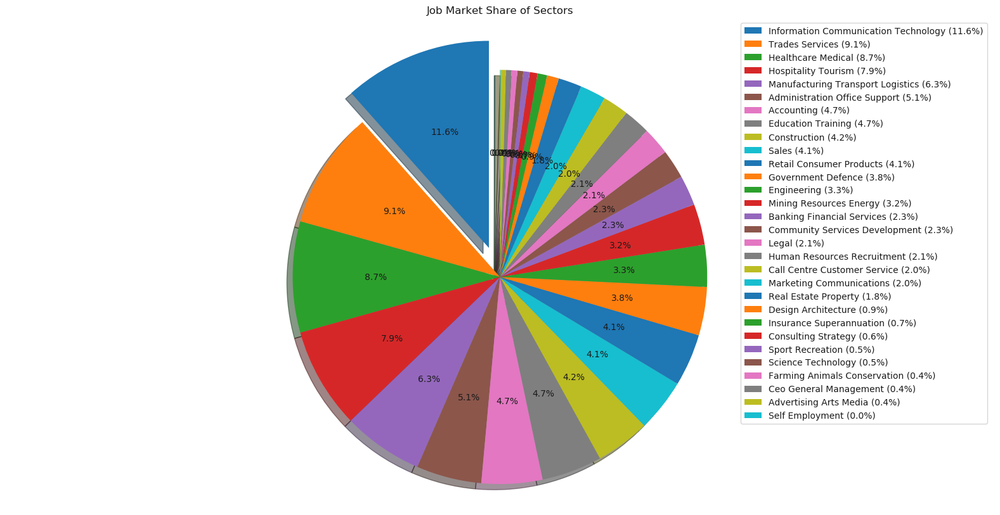

In [36]:
# Plot the sectors in order of their market share (counter-clockwise)
fig, ax = plt.subplots(figsize=(20, 10))
explode = [0.15 if i == 0 else 0.0 for i in range(len(sectors))]
ax.pie(market_shares, explode=explode, autopct='%1.1f%%', shadow=True, startangle=90)
ax.axis('equal')

plt.legend(["{} ({:.1f}%)".format(sectors[i], market_shares[i] * 100) for i in range(len(sectors))], loc="best")
plt.title("Job Market Share of Sectors")
plt.show()

In [37]:
# Save the pie chart data to a json file
json_pie_chart_marketshare_sectors_list = []

for i in range(len(sectors)):
    json_pie_chart_marketshare_sectors_list.append({"sector": sectors[i].title(), "job_advertisement_count": counts[i]})
    
with open("json_pie_chart/marketshare_sectors_pie_chart.json", "w") as fout:
    json.dump(json_pie_chart_marketshare_sectors_list, fout)

### In each sector, which sub-sectors are the main spotlights?

The following investigation was carried out to examine what sub-sectors were the main spotlights within each sector. This can be seen as a subsequent study to *Which sectors keep the highest market share?*, providing a more detailed analysis for each of the sectors. Finding the most popular sub-sectors within a given sector provides information in regard to what specific fields are popular among the sector. This can be used for further suggestions in regard to promising career paths. For example, by analysing the sub-sectors of the ICT profession, students can gain a better understanding of what jobs are avaliable, which of those jobs are in demand, and the general diversity in the field. Diversity can be considered a very important factor when determining a field to enter, because after working in one subfield for some time, if someone is looking to make a change, then a career in a sector with a lot of subfield diversity provides many options to choose from. In comparison, a sector with a small number of sub-sectors limits that person's future options with that sector. Not only is this information useful for recommending and evaluating career paths, it can also be used by companies, universities and the government to gather a deeper understanding of a particular field. For example, if universities saw that the field of education required more secondary teachers than primary teachers, they might decide to change part of the curriculum towards secondary school teaching courses. Thus, assisting their graduates in finding jobs. Companies can use the information to determine what salaries they should advertise for subfield-specific positions. If there is a high demand for that subfield, then the company may increase the starting salary of the position, and vice-versa. 

A pie chart was used for analysing the sub-sectors within each sector due to the fact that the sub-sector job listing counts for a particular sector make up a whole (i.e. the total job listings for that particular sector). Consequently, the portion of the sector market share that is taken up by each sub-sector can be intuitively represented within a pie chart. In order to implement this, the job advertisement counts of each sub-sector within all sectors was found, converted into a percentage representation, and then the top 5 sub-sectors with the greatest sector market share were displayed in pie charts. 

This analysis allowed us to visualise and determine the most popular subfields within each sector. Moreover, we were able to determine how much of the sector market share is taken up by the top 5 sub-sectors within the sector. For example, in the *Retail Consumer Products* sector, the top 5 most popular sub-sectors made up 94.3% of the total sector market share. Whereas in the *Healthcare Medical* sector for example, the top 5 most popular sub-sectors contributed to only 43.4% of the total sector market share. Therefore for sectors such as the *Retail Consumer Products* sector, we can conclude that there is limited options in the sector with respect to diversity in sub-sector. In comparison, for sectors whose top 5 subfields made up a rather small portion of the total sector market share, such as in the *Healthcare Medical* sector, we conclude that there exists many more subfields with decent sector market shares and therefore more opportunities for diversity within those sectors.

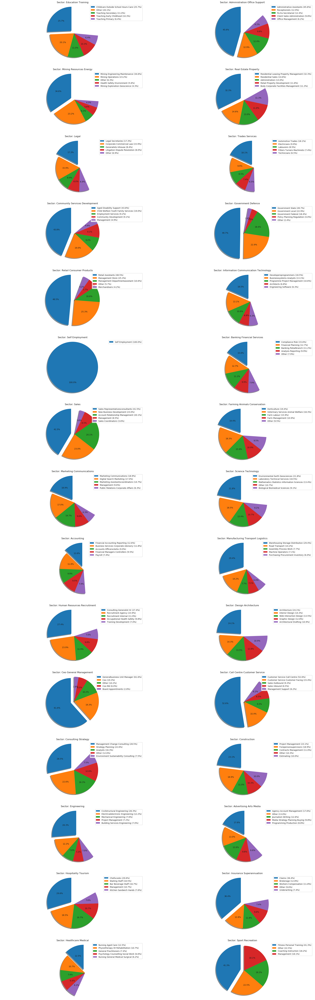

In [38]:
# Display options can be either "Graphical" or "Textual"
display = "Graphical"

query_df = sqlContext.sql("SELECT DISTINCT Classification \
                           FROM job_listings").toPandas()
sectors = [c for c in np.array(query_df["Classification"]) if str(c) != "nan"]
sector_top_subsectors = {}
top_n = 5

for sector in sectors:
    
    # Find the job listing counts of each sub-sector
    query_df = sqlContext.sql("SELECT SubClassification, COUNT(*) \
                               FROM job_listings \
                               WHERE Classification='{}'\
                               GROUP BY SubClassification \
                               ORDER BY COUNT(*) DESC".format(sector)).toPandas()
    
    subsectors = query_df["SubClassification"].tolist()
    job_counts = query_df["count(1)"].tolist()
    
    # Normailze counts into the range of 0-100%
    s = sum(job_counts)
    subsector_shares = [c/s for c in job_counts]
    
    # Find the top 5 sub-sectors in the sector
    top_subsectors = [(subsectors[i], subsector_shares[i]) for i in range(len(subsectors))]
    top_subsectors = sorted(top_subsectors, key=lambda x:x[1], reverse=True)
    top_subsectors = top_subsectors[:top_n]
    
    # Textual display 
    if display == "Textual":
        print("Sector: {}\n".format(sector.title()))
        for subsector in top_subsectors:
            print("\t{:<40} {:.1f}%".format(subsector[0].title(), subsector[1]*100))
        print()
    
    # Graphical display
    if display == "Graphical":
        sector_top_subsectors[sector] = top_subsectors
    
# Graphical display
if display == "Graphical":
    
    i = 0
    fig, ax = plt.subplots(nrows=15, ncols=2, figsize=(28, 90))

    for row in ax:
        for col in row:
            
            sector = sectors[i]
            subsectors = [s[0] for s in sector_top_subsectors[sector]]
            subsector_shares = [s[1] for s in sector_top_subsectors[sector]]
            
            subsectors = [w.title() for w in subsectors]
            
            # Explode subssector with greatest market share within the sector
            explode = [0.15 if i == 0 else 0.0 for i in range(len(subsector_shares))]
            col.pie(subsector_shares, explode=explode, autopct='%1.1f%%', shadow=True, startangle=90)
            col.axis('equal')
            col.set_title("Sector: {}".format(sector.title()))
            col.legend(["{} ({:.1f}%)".format(subsectors[i], subsector_shares[i] * 100) for i in 
                        range(len(subsectors))], loc="upper right")
            
            i += 1
    plt.show()

### What is the salary range for each sector/sub-sector?

Here we analysed the salary range of all sectors and sub-sectors within the dataset. Analysing the salary range of a given sector/sub-sector provides information in regard to the possible salaries people are receiving within those fields/subfields. This is a further indicator of whether a particular sector/sub-sector is currently in demand, as companies will generally offer higher salaries in order to secure employees. Additionally, it also provides a suggestion towards the level of expertise required for a particular subfield. Since job advertisements for subfields such as surgery and CEO would offer higher salaries than those of say locksmiths or bakers. Furthermore, students who are wanting a career path that offers high paying salaries may also use this information to determine which field they study at university. 

Because we were just interested in finding the salary range for all sectors and sub-sectors, we decided a graphical analysis would not be necessary. We therefore determined the lowest salary range and highest salary range for each sector and sub-sector, and then displayed this information in a table-like format. 

We found that all sectors within the dataset offered jobs between the annual salary range of \\$0 to \\$200,000+. There was therefore no disparity between the salary of the particular sectors. This however was not the case with sub-sectors. Some sub-sectors were found to have much smaller salary ranges than others. For example, the sub-sector *Housekeeping* had an annual salary range of \\$0 to \\$80,000, the *Farm Labour* sub-sector had an annual salary range of \\$0 to \\$150,000, and *Nannies Babysitters* was the sub-sector with the lowest annual salary range of \\$0 to \\$60,000. In comparison, sub-sectors such as *Oil Gas Drilling*, *Aerospace Engineering* and *Intellectual Property Law* all had annual salary ranges of \\$0 to \\$200,000+. As mentioned previously, these figures provide information in regard to the sub-sector's required level of expertise. Required level of expertise appeared to be a better indicator for annual salary range than current demand within the sub-sector. It is hypothesised that this is the case because businesses will not significantly increase their offered salaries even if a job/sub-sector is in demand. For example, if all of a sudden *Farm Labour* was in demand, farmers would not offer salaries for farm labour equivalent to that of a job within the *Banking Finance Law* sub-sector, since there is not as many required prerequisites for such a labour job in comparison to that of job in banking or financial law.

In [39]:
# Create a dictionary mapping {sector: [lower salary range, upper salary range]}
sector_salary_range = {}

# Create a dictionary mapping {subsector: [lower salary range, upper salary range]}
subsector_salary_range = {}

for index, row in df.iterrows():
    sector = row["Classification"]
    subsector = row["SubClassification"]
    range_lower = row["LowestSalary"]
    range_upper = row["HighestSalary"]
        
    if str(sector) != "nan" or not math.isnan(sector):
        
        # Update sector salary range
        if sector in sector_salary_range:
            if range_lower < sector_salary_range[sector][0]:
                sector_salary_range[sector][0] = range_lower
            if range_upper > sector_salary_range[sector][1]:
                sector_salary_range[sector][1] = range_upper
        else:
            sector_salary_range[sector] = [range_lower, range_upper]

    if str(subsector) != "nan" or not math.isnan(subsector):
        
        # Update subsector salary range
        if subsector in subsector_salary_range:
            if range_lower < subsector_salary_range[subsector][0]:
                subsector_salary_range[subsector][0] = range_lower
            if range_upper > subsector_salary_range[subsector][1]:
                subsector_salary_range[subsector][1] = range_upper
        else:
            subsector_salary_range[subsector] = [range_lower, range_upper]

In [40]:
# Convert salary ranges to annual salary ranges representative of the SEEK website
formatted_sector_salary_range = {}
for sector, salary_range in sector_salary_range.items():
    lower = salary_range[0]
    upper = salary_range[1]
    
    if lower == 0 and upper != 999:
        formatted_sector_salary_range[sector] = ["${}".format(lower), "${},000".format(upper)]
    elif lower == 0 and upper == 999:
        formatted_sector_salary_range[sector] = ["${}".format(lower), "$200,000+"]
    elif lower != 0 and upper != 999:
        formatted_sector_salary_range[sector] = ["${},000".format(lower), "${},000".format(upper)]
    elif lower != 0 and upper == 999:
        formatted_sector_salary_range[sector] = ["${},000".format(lower), "$200,000+"]
    else:
        print("Unexpected sector range: {} - {}".format(lower, upper))
        
formatted_subsector_salary_range = {}
for sector, salary_range in subsector_salary_range.items():
    lower = salary_range[0]
    upper = salary_range[1]
    
    if lower == 0 and upper != 999:
        formatted_subsector_salary_range[sector] = ["${}".format(lower), "${},000".format(upper)]
    elif lower == 0 and upper == 999:
        formatted_subsector_salary_range[sector] = ["${}".format(lower), "$200,000+"]
    elif lower != 0 and upper != 999:
        formatted_subsector_salary_range[sector] = ["${},000".format(lower), "${},000".format(upper)]
    elif lower != 0 and upper == 999:
        formatted_subsector_salary_range[sector] = ["${},000".format(lower), "$200,000+"]
    else:
        print("Unexpected subsector range: {} - {}".format(lower, upper))

In [41]:
# Store information in lists for graphing
sectors = []

# Display sector salary ranges
print("{:<36}      {}".format("Sector", "Salary Range"))
print("-"*55)
for sector, salary_range in formatted_sector_salary_range.items():
    sectors.append(sector)
    print("{:<36}     {} - {}".format(sector.title(), salary_range[0], salary_range[1]))

Sector                                    Salary Range
-------------------------------------------------------
Retail Consumer Products                 $0 - $200,000+
Call Centre Customer Service             $0 - $200,000+
Hospitality Tourism                      $0 - $200,000+
Banking Financial Services               $0 - $200,000+
Manufacturing Transport Logistics        $0 - $200,000+
Sales                                    $0 - $200,000+
Administration Office Support            $0 - $200,000+
Trades Services                          $0 - $200,000+
Accounting                               $0 - $200,000+
Real Estate Property                     $0 - $200,000+
Healthcare Medical                       $0 - $200,000+
Marketing Communications                 $0 - $200,000+
Government Defence                       $0 - $200,000+
Information Communication Technology     $0 - $200,000+
Education Training                       $0 - $200,000+
Community Services Development           $0 - $20

In [42]:
# Store information in lists for graphing
subsectors, lower_ranges, upper_ranges, subsector_ranges = [], [], [], []

# Display subsector salary ranges
print("{:<47}      {}".format("Subsector", "Salary Range"))
print("-"*67)
for subsector, salary_range in formatted_subsector_salary_range.items():
    
    subsector_range = (salary_range[0], salary_range[1])
    if subsector_range not in subsector_ranges: subsector_ranges.append(subsector_range)
    
    subsectors.append(subsector)
    lower_ranges.append(salary_range[0])
    upper_ranges.append(salary_range[1])
    print("{:<47}     {} - {}".format(subsector.title(), salary_range[0], salary_range[1]))

Subsector                                            Salary Range
-------------------------------------------------------------------
Retail Assistants                                   $0 - $200,000+
Sales Inbound                                       $0 - $120,000
Customer Service Call Centre                        $0 - $200,000+
Waiting Staff                                       $0 - $200,000+
Sales Outbound                                      $0 - $200,000+
Kitchen Sandwich Hands                              $0 - $100,000
Banking Retailbranch                                $0 - $200,000+
Customer Service Customer Facing                    $0 - $120,000
Bar Beverage Staff                                  $0 - $200,000
Housekeeping                                        $0 - $80,000
Other                                               $0 - $200,000+
Assembly Process Work                               $0 - $200,000+
Purchasing Procurement Inventory                    $0 - $200,000+
S

Law Clerks Paralegals                               $0 - $150,000
Collections                                         $0 - $200,000+
Pathology                                           $0 - $200,000+
Freightcargo Forwarding                             $0 - $200,000+
Policy Planning Regulation                          $0 - $200,000+
Veterinary Services Animal Welfare                  $0 - $200,000
Nursing High Acuity                                 $0 - $150,000
Construction Law                                    $0 - $200,000+
Oil Gas Engineering Maintenance                     $0 - $200,000+
Industrial Engineering                              $0 - $200,000+
Mining Processing                                   $0 - $200,000+
Technical Writing                                   $0 - $200,000+
Nursing Educators Facilitators                      $0 - $200,000
Industrial Relations Employment Law                 $0 - $200,000+
Process Engineering                                 $0 - $200,000+

### Can you compare salary range between sectors/sub-sectors?

The preceding study, *What is the salary range for each sector/sub-sector?*, looked at the annual salary range of job advertisements within each sector and sub-sector. The investigation simply examined these salaries, without any comparison. Consequently, this investigation compares the annual salary range of sectors and sub-sectors. By comparing these metrics, we are able to discover the distribution of jobs within an annual salary range for a particular sector, rather than just knowing a certain sector has job advertisements offering salaries within the range of \\$0 to \\$200,000+. 

To compare the sectors, we decided that we would examine the number of sub-sectors in each sector that were within a specified salary range. In regard to implementation, we defined "annual salary range buckets" for each sector. If a job advertisement belonged to a sub-sector within a given sector, then the annual salary range of that job advertisement would be determined and the bucket corresponding to that annual salary range for the given sector would then have an additional count added to it. A stacked column chart was then used to visualise these sector annual salary range buckets to compare the sub-sector annual salary ranges between sectors.

The stacked column chart provided interesting insights into each of the sector's job advertisements. The sector *Ceo General Management* was found to have sub-sector job advertisements mainly within the annual salary range of \\$120,000 to \\$200,000+. Whereas the sectors *Retail Consumer Products* and *Hospitality Tourism*, while have significantly more job advertisements than *Ceo General Management*, had the majority of their sub-sector job listings within the lower annual salary ranges. Furthermore, all sectors appeared to have a relatively even distribution among the sub-sector annual salary ranges that were present within the sector. However, there was sectors such as *Information Communication Technology* whose annual salary range distribution appeared somewhat skewed. In the case of *Information Communication Technology*, the sub-sector annual salary ranges were skewed towards $200,000 to \\$200,000+, highlighting that the sector has a signifcant portion of its jobs that are well paying.

In [43]:
subsector_ranges = sorted(subsector_ranges, key=lambda x:x[1])
subsector_ranges_strings = ["{} - {}".format(sr[0], sr[1]) for sr in subsector_ranges]

# Create a dictionary mapping {subsector ranges: a list of sector counts} i.e. {"0-999": [5, 0, 0, 2, 17, ...]}
subsector_range_sector_counts = {}

for index, row in df.iterrows():
    sector = row["Classification"]
    lower = row["LowestSalary"]
    upper = row["HighestSalary"]
    
    if str(sector) != "nan" or not math.isnan(sector):
        
        # Get range of current row
        if lower == 0 and upper != 999:
            subsector_range = "{} - {},000".format(lower, upper)
        elif lower == 0 and upper == 999:
            subsector_range = "{} - 200,000+".format(lower)
        elif lower != 0 and upper != 999:
            subsector_range = "{},000 - {},000".format(lower, upper)
        elif lower != 0 and upper == 999:
            subsector_range = "{},000 - 200,000+".format(lower)
        else:
            print("Unexpected subsector range: {} - {}".format(lower, upper))
        
        # Update subsector range sector counts
        if subsector_range in subsector_range_sector_counts:
            subsector_range_sector_counts[subsector_range][sectors.index(sector)] += 1
        else:
            subsector_range_sector_counts[subsector_range] = [0 for i in range(len(sectors))]
            subsector_range_sector_counts[subsector_range][sectors.index(sector)] += 1

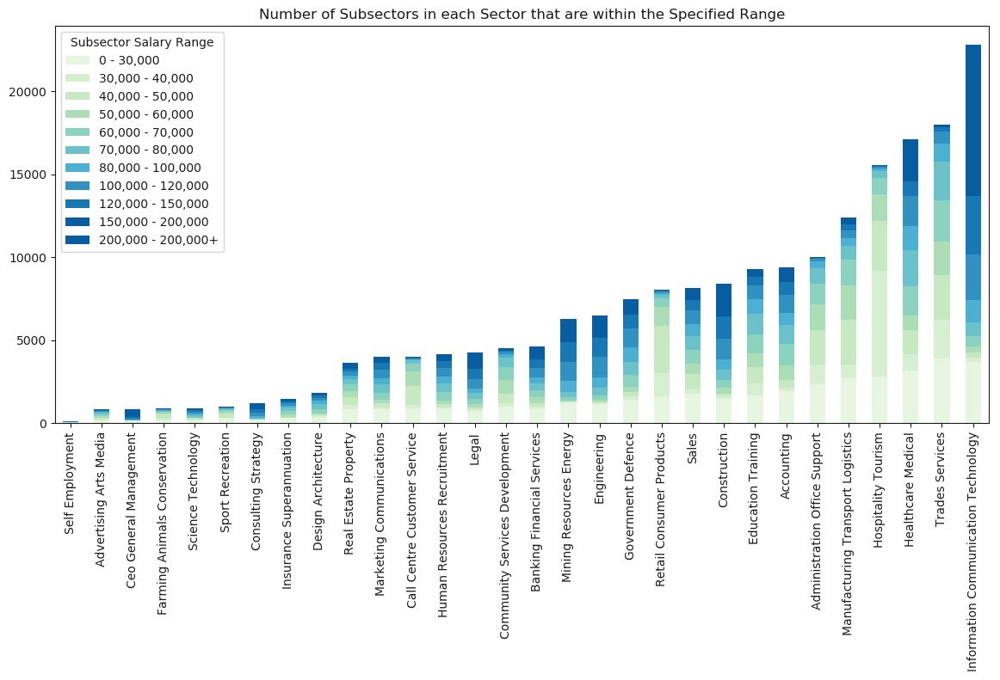

In [44]:
# Reset matplotlib display settings
mpl.rcParams.update(mpl.rcParamsDefault)

# Construct data frame to hold graph information
df_columns = ["Subsector Salary Range"] + [w.title() for w in sectors]
df_data = [[subsector_range] + sector_counts for subsector_range, sector_counts in subsector_range_sector_counts.items()]
sector_subsector_graph_df = pd.DataFrame(columns=df_columns, data=df_data)

# Plot graph of the number of subsectors in each sector that are within the specified range
sector_subsector_graph_df.set_index('Subsector Salary Range')\
    .reindex(sector_subsector_graph_df.set_index('Subsector Salary Range').sum().sort_values().index, axis=1)\
    .T.plot(kind='bar', title='Number of Subsectors in each Sector that are within the Specified Range', 
            stacked=True, colormap=ListedColormap(sns.color_palette("GnBu", 10)), figsize=(14,6))

plt.show()

In [45]:
# Save the stacked column chart data to a json file
json_stacked_column_list = []

for sector in sectors:
    stacked_column_dict = {"sector": sector.title()}
    sector_column = list(sector_subsector_graph_df[sector.title()])
    
    for i in range(len(subsector_ranges_strings)):
        subsector_range = subsector_ranges_strings[i]
        stacked_column_dict[subsector_range] = int(sector_column[i])
        
    json_stacked_column_list.append(stacked_column_dict)
    
with open("json_stacked_column/stacked_column.json", "w") as fout:
    json.dump(json_stacked_column_list, fout)

### Can you detect which skills are required in each sector? 

The following investigation looks at the required skillsets for each sector in the database. This investigation was conducted to examine the job advertisements on SEEK and determine if there was a select number of skillsets that were most frequently requested within a particular sector. This information would then allow high school students contemplating whether to start in that sector to see what would be required of them, and what they should prepare for. It would allow university students to see what skills they need to develop in order to enter the workforce, and it would allow people already working within the field to see what skills they are expected to have and should therefore maintain. Moreover, by examining the most common skillsets across all sectors, we can determine what are the most popular skillsets to have for any profession. Teaching bodies such as schools and universities could take this list of skillsets and ensure that all of their students receive additional teaching in regard to them so that they will be able to develop these skills for their future job prospects. 

Our first idea was to examine the *Requirement* attribute of the provided SEEK dataset. However, this information was simply textual, and would consequently require advanced natural language processing to determine the context of sentences and then extract skillsets relevant to the specific sector and sub-sector. We consequently hypothesised another method for skillset extraction. The *FullDescription* attribute provided the raw description of the job advertisement in HTML. After analysing job advertisements on the SEEK website, we observed a common trend in job listings. Job listings would list the required skills for the job in bulletpoints. We thought that we would therefore be able to simply extract bulletpoint information from the full descriptions to build a dataset of skillset related sentences. But, we found that job listings would contain additional information in bulletpoints, such as what the job was about and what the person would be required to do. Our solution around this problem was to firstly find all bulletpoint listings within the full description, and then look at the text above them for context. If the contextual text contained words such as *requirements* or *attributes*, then we would assume the following bulletpoints were in relation to the required skillsets and therefore would extract them for our dataset. We then used term frequency–inverse document frequency (tf-idf) as a metric to determine which ngrams were the most popular skillsets for each sector.

More specifically, our approach was to firstly find `ul` tags within the full descriptions, then look at the text within `p` tags above each of the `ul` tags for context, and if the contextual text contained words alluding to the fact that the following `ul` tags were in relation to job required skills, we would then extract the `li` tag sentences and add them as documents into the corresponding sector's skillset sentence dataset. tf-idf was then used to determine the most popular skillsets from these datasets for each sector. 

Example full description HTML for further intuition behind the approach:

```
-------------------------

<p>Skills required:</p>

<ul>
    <li> Skill 1 </li>
    <li> Skill 2 </li>
    <li> Skill 3 </li>
</ul>

-------------------------
```

The results of this investigation provided relevant skillsets for each of the sectors within the dataset. We observed that some of the initially found skillsets were not exactly describing the skills involved, so we investigated them further before adding them as stop words. We compared the skillsets of sectors using a scatter text graph and found that even in fields which appear significantly different, such as *Trades Services* and *Information Communication Technnology*, there are quite a number of similar skillsets found among them. We then merged the skillset datasets of all sectors together in order to study the most popular skillsets among all sectors. The most popular skillset was found to be *communication skills*, followed by *customer service*, which are known to be valued by employers in all fields. Interestingly, having a drivers license (or in regard to skillsets, having the ability to drive), was ranked fourth, above skills of *management*, *team player* and *time management*. However, these skillsets were still very popular among job advertisements. 

#### Top skillsets for each sector

Here we determined the top skillsets for each sector.

In [46]:
# Create a dictionary mapping {sector: [Full Description 1, Full Description 2, ...]}
sector_fulldescription_documents = {}

for index, row in df.iterrows():
    sector = row["Classification"]
    fulldescription = row["FullDescription"]
    
    if str(sector) != "nan" and str(fulldescription) != "nan":
        
        if sector in sector_fulldescription_documents:
            sector_fulldescription_documents[sector].append(fulldescription)
        else:
            sector_fulldescription_documents[sector] = [fulldescription]

In [47]:
def string_stemmer(text):
    """ Stems the words within a string.
    
    Example input output mapping with PorterStemmer algorithm:
        - input: "The leaves were growing evenly across the tree."
        - output: "the leav were grow evenli across the tree."
    
    :param text: A string containing words to be stemmed.
    :return: A string with stemmed words.
    """
    
    # Tokenize text
    tokens = text.split()
    
    # Stemming
    stemmer = PorterStemmer()
    ret = " ".join([stemmer.stem(token) for token in tokens])
    
    return ret

def normalise(text):
    """ Normalises the text within a string.
    
    Specifically, the unicode charaters within the passed string 
    are firstly converted to regular characters. The punctuation 
    within the string is then removed. Whitespace characters are 
    subsequently removed from the string, leaving a single space
    between words, and finally the charaters are set to lowercase
    before the string is returned.
    
    :param text: A string to be normailsed.
    :return: A string with normailsed text.
    """
    
    # Normalise unicode charaters
    normalised_text = unicodedata.normalize("NFKD", text)
    
    # Clean punctuation
    normalised_text = normalised_text.translate(str.maketrans('', '', string.punctuation))

    # Set the whitespace between words to be a single space
    tokens = normalised_text.split()
    normalised_text = " ".join(tokens)
    
    return normalised_text.lower()

In [48]:
# Skillset vocabulary
raw_skillset_vocab = ["requirement", "require", "skills", "attributes"]
skillset_vocab = [normalise(word) for word in raw_skillset_vocab]

# Create a dictionary mapping {sector: [Bullet Point Document 1, Bullet Point Document 2, ...]}
sector_bulletpoint_documents = {}
for key in sector_fulldescription_documents.keys():
    sector_bulletpoint_documents[key] = []

# For each sector
for sector, docs in sector_fulldescription_documents.items():
    
    print("{} in progress...".format(sector.title()), end="")
    
    # For each full description document for this sector
    for doc in docs:
        
        # Create soup object
        soup = bs.BeautifulSoup(doc, "lxml")
        
        # Final all ul tag blocks
        for u_list in soup.find_all("ul"):
            
            if u_list.find_previous_sibling("p"):
                prior_paragraph = u_list.find_previous_sibling("p").text
                norm_prior_paragraph = string_stemmer(prior_paragraph)

                # Check if prior paragraph was in relation to skillsets
                if any(w in norm_prior_paragraph for w in skillset_vocab):

                    # For each individual point within the ul tags
                    for li_point in u_list.find_all("li"):

                        # Add the skillset point to the sector's bulletpoint document list
                        sector_bulletpoint_documents[sector].append(normalise(li_point.text))
                        
    print("Complete")

Trades Services in progress...Complete
Banking Financial Services in progress...Complete
Education Training in progress...Complete
Engineering in progress...Complete
Information Communication Technology in progress...Complete
Government Defence in progress...Complete
Marketing Communications in progress...Complete
Ceo General Management in progress...Complete
Human Resources Recruitment in progress...Complete
Accounting in progress...Complete
Design Architecture in progress...Complete
Manufacturing Transport Logistics in progress...Complete
Legal in progress...Complete
Real Estate Property in progress...Complete
Healthcare Medical in progress...Complete
Hospitality Tourism in progress...Complete
Construction in progress...Complete
Sport Recreation in progress...Complete
Sales in progress...Complete
Retail Consumer Products in progress...Complete
Call Centre Customer Service in progress...Complete
Mining Resources Energy in progress...Complete
Administration Office Support in progress..

In [49]:
# Create dictionary mapping {sector: [(word, tf-idf), (word, tf-idf)]}
sector_word_frequencies = {}

# Create a custom stop word list to incorporate job specific stop words
seek_stop_words = ["ability", "work", "high", "level", "experience", "highly", "regarded"]
custom_stop_words = feature_extraction.text.ENGLISH_STOP_WORDS.union(seek_stop_words)

# Define vectorizer for determining the tf-idf score of ngrams
tfidf = TfidfVectorizer(analyzer='word', ngram_range=(2,5), min_df=1, stop_words=custom_stop_words, max_features=500)

# Determine the top n skills for each sector
top_n = 10
for sector, docs in sector_bulletpoint_documents.items():
    
    features = tfidf.fit(sector_bulletpoint_documents[sector])
    corpus_tf_idf = tfidf.transform(sector_bulletpoint_documents[sector]) 
    
    sum_words = corpus_tf_idf.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in tfidf.vocabulary_.items()]
    
    # Update sector word frequencies dictionary
    sector_word_frequencies[sector] = words_freq
    
    print("{:<60}  {}".format("Top skillsets in " + sector.title(), "TF-IDF"))
    print("-"*68)
    for word_rank in sorted(words_freq, key = lambda x: x[1], reverse=True)[:top_n]:
        print("{:<60} {:>7.3f}".format(word_rank[0].title(), word_rank[1]))
    print()

Top skillsets in Trades Services                              TF-IDF
--------------------------------------------------------------------
Communication Skills                                         207.772
Drivers Licence                                              191.828
White Card                                                   179.299
Customer Service                                             134.493
Team Environment                                             118.020
Trade Qualification                                          102.731
Working Heights                                               94.406
Minimum Years                                                 93.832
Drivers License                                               91.787
Trade Qualified                                               79.349

Top skillsets in Banking Financial Services                   TF-IDF
--------------------------------------------------------------------
Communication Skills             

Service Skills                                                28.399
Lead Change                                                   27.708
Team Environment                                              26.432
Time Management                                               26.388

Top skillsets in Call Centre Customer Service                 TF-IDF
--------------------------------------------------------------------
Customer Service                                             101.277
Communication Skills                                          47.387
Data Entry                                                    27.426
Contact Centre                                                26.127
Positive Attitude                                             23.336
Excellent Communication                                       22.285
Problem Solving                                               20.605
Team Player                                                   17.226
Team Environment                 

#### Determine if words are worth being stop words for the skillset search

Here we investigated words that were initially appearing as the most popular required skillsets which were not necessarily a specific skillset. For example, *highly* and *regarded* were appearing frequently since they are words used to describe desired skillsets, as in the sentence: "*highly* developed organisational skills to enable the incumbent to manage multiple tasks and competing deadlines", where the focus skillset is actually *organisational skills*. 

In [50]:
def stopword_check(sector, query, top_k=5):
    """ Prints the top k most similar sector-specific documents to the query.
    
    The purpose of this function is to find documents which are similar to
    the query in order to determine if the words in the query should be stop
    words when determing sector skillsets. 
    
    :param sector: A string representing a sector.
    :param query: A string containing the words to be used in the query.
    :param top_k: An integer specifying the top k similar documents to display.
    """
    
    # Use bulletpoints as the original documents to check context
    original_documents = sector_bulletpoint_documents[sector]

    # Determine the tf-idf corpus of the words within the original document
    features = tfidf.fit(original_documents)
    corpus_tf_idf = tfidf.transform(original_documents) 

    # Use cosine similarity to determine which documents most closely match the query
    new_features = tfidf.transform([query])
    cosine_similarities = linear_kernel(new_features, corpus_tf_idf).flatten()
    related_docs_indices = cosine_similarities.argsort()[::-1]

    # Display top k documents matching the query
    print("Top {} documents:".format(top_k))
    for i in range(top_k):
        print(i, original_documents[related_docs_indices[i]])

In [51]:
stopword_check("trades services", "ability work")

Top 5 documents:
0 work vehicle
1 competent computer skills
2 sound mechanical knowledge and experience
3 highly motivated attention to detail and take pride in your work
4 a honest and reliable work ethic


In [52]:
stopword_check("legal", "high level")

Top 5 documents:
0 a desire to grow your career for the long term
1 demonstrated experience working in a commercial contracting environment with experience within the defence industry environment highly desirable
2 ability to continue developing their caseload by build strong client relationships and assisting in the expansion of the firm long term
3 ability to work independently
4 entrepreneurial spirit


In [53]:
stopword_check("science technology", "highly regarded")

Top 5 documents:
0 you communicate effectively have excellent interpersonal skills and a collaborative working approach
1 the ability to perform manual handling and lift 15 – 20kg safely
2 highly developed organisational skills to enable the incumbent to manage multiple tasks and competing deadlines
3 excellent written analytical and report writing skills in particular the ability to draft reports procedures and other documents of high quality
4 proven ability to read and implement complex information in the form of legislation codes of practice and guidelines and use that information to provide advice to stakeholders


#### Top skillsets over all sectors

Here we examined the top skillsets among all sectors combined.

In [54]:
# Create dictionary mapping for all sectors {"all_sectors": [(word, tf-idf), (word, tf-idf)]}
all_sector_word_frequencies = {}

# Determine the top n skills for all sectors
top_n = 10

# Create a bulletpoint document list of the documents from all sectors
all_sector_bulletpoint_documents = []
for sector, docs in sector_bulletpoint_documents.items():
    all_sector_bulletpoint_documents += docs

# Determine the tf-idf corpus of the words within the documents
features = tfidf.fit(all_sector_bulletpoint_documents)
corpus_tf_idf = tfidf.transform(all_sector_bulletpoint_documents) 

sum_words = corpus_tf_idf.sum(axis=0)
words_freq = [(word, sum_words[0, idx]) for word, idx in tfidf.vocabulary_.items()]

# Update all sectors word frequencies dictionary
all_sector_word_frequencies["all_sectors"] = words_freq

print("{:<60}  {}".format("Top skillsets among all sectors", "TF-IDF"))
print("-"*69)
for word_rank in sorted(words_freq, key = lambda x: x[1], reverse=True)[:top_n]:
    print("{:<60} {:>7.3f}".format(word_rank[0].title(), word_rank[1]))
print()

Top skillsets among all sectors                               TF-IDF
---------------------------------------------------------------------
Communication Skills                                         1717.218
Customer Service                                             1273.434
Minimum Years                                                1066.726
Drivers Licence                                              806.284
Excellent Communication                                      737.799
Management Skills                                            651.963
Team Player                                                  646.687
Team Environment                                             635.243
Time Management                                              618.976
Project Management                                           593.351



#### Word clouds

Word clouds were used as a data visualisation technique to examine the most popular skillsets for each sector, and for all sectors collectively.

In [55]:
def word_cloud(sector, word_frequencies, display=True, save_json=False):
    
    # Create word frequency dictionary
    word_freq_dict = {}
    for (word, freq) in word_frequencies:
        word_freq_dict[word] = freq
    
    if save_json:
        
        # Convert word frequency dictionary into a list of dictionaries
        json_word_freq_list = []
        for word, freq in word_freq_dict.items():
            json_word_freq_list.append({"word": word, "frequency": freq})
    
    if display:
        
        # Generate word cloud from frequencies
        wc = WordCloud(background_color="white", max_words=1000)
        wc.generate_from_frequencies(word_freq_dict)

        # Display word cloud
        plt.figure(figsize=(7,7))
        plt.imshow(wc, interpolation="bilinear")
        plt.axis("off")
        plt.show()
        
    if save_json:
        
        # Return json formatted list for saving to file
        return json_word_freq_list

In [56]:
# Save json objects to file for all individual sectors and for all sectors combined
json_complete_word_freq_list = []

# Individual sectors
for sector in sector_word_frequencies.keys():
    word_freq_list = word_cloud(sector, sector_word_frequencies[sector], False, True)
    json_complete_word_freq_list.append({sector: word_freq_list})

# All sectors combined
word_freq_list = word_cloud("all_sectors", all_sector_word_frequencies["all_sectors"], False, True)
json_complete_word_freq_list.append({"all_sectors": word_freq_list})

# Save json to file
with open("json_wordcloud/wordcloud_{}.json".format("complete"), "w") as fout:
            json.dump(json_complete_word_freq_list, fout)

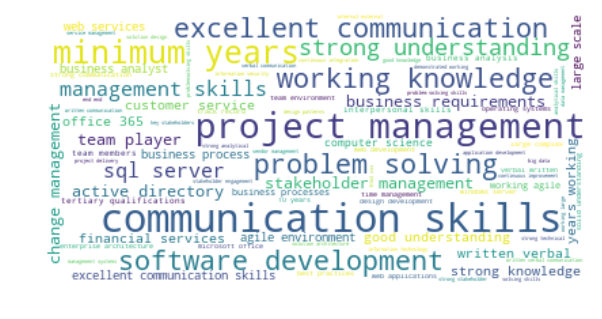

In [57]:
# Display a word cloud for the Information Communication Technology sector
sector = "information communication technology"
word_cloud(sector, sector_word_frequencies[sector])

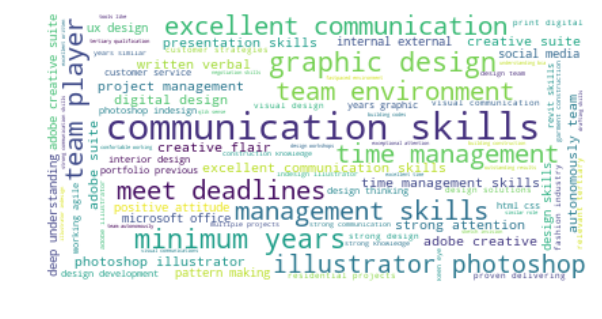

In [58]:
# Display a word cloud for the Design Architecture sector
sector = "design architecture"
word_cloud(sector, sector_word_frequencies[sector])

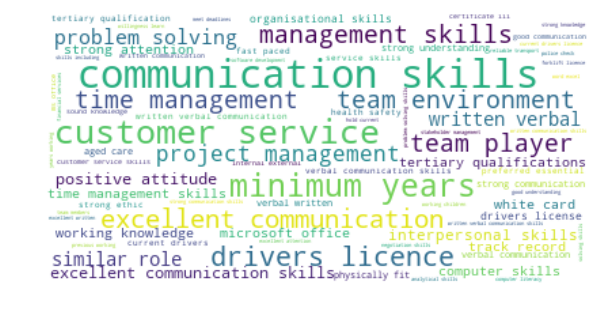

In [59]:
# Display a word cloud for the top skillsets among all sectors
sector = "all_sectors"
word_cloud(sector, all_sector_word_frequencies[sector])

#### Scatter text

Scatter texts were used to compare and visualise the skillsets of different sectors.

In [60]:
# Define the two sectors to compare skillsets against
first_sector = "trades services"
second_sector = "information communication technology"

# Collect the first sector's documents and create a corresponding tag for each of them
first_sector_skill_sentences = []
for (word, freq) in sector_word_frequencies[first_sector]:
    underscore_joined_word = "_".join(word.split())
    word_list = [underscore_joined_word] * int(freq)
    first_sector_skill_sentences += word_list
first_sector_sector_tags = [first_sector.title() for i in range(len(first_sector_skill_sentences))]

# Collect the second sector's documents and create a corresponding tag for each of them
second_sector_skill_sentences = []
for (word, freq) in sector_word_frequencies[second_sector]:
    underscore_joined_word = "_".join(word.split())
    word_list = [underscore_joined_word] * int(freq)
    second_sector_skill_sentences += word_list
second_sector_sector_tags = [second_sector.title() for i in range(len(second_sector_skill_sentences))]

# Merge the documents and tags of each of the sectors
skill_sentences = first_sector_skill_sentences + second_sector_skill_sentences
sector_tags = first_sector_sector_tags + second_sector_sector_tags

# Create a pandas DataFrame out of the merged documents and tags
st_data = {"SkillSentence": skill_sentences, "Sector": sector_tags}
st_df = pd.DataFrame(st_data)

In [61]:
# Create a spaCy model
nlp = spacy.load('en')

# Create a ScatterText corpus
corpus = st.CorpusFromPandas(st_df, 
                             category_col='Sector', 
                             text_col='SkillSentence',
                             nlp=nlp).build()

In [62]:
# Create a HTML visual of the ScatterText:
html = st.produce_scattertext_explorer(corpus,
        category=first_sector.title(),
        category_name=first_sector.title(),
        not_category_name=second_sector.title(),
        minimum_term_frequency=10,
        width_in_pixels=1000)

In [63]:
# Open, save, and display the HTML
file_name = "Sector-Visualization.html"
open(file_name, 'wb').write(html.encode('utf-8'))
IFrame(src=file_name, width = 1400, height=700)

### What is trending in the job market? 

The following analysis was conducted to use the findings from the previous investigations in order to determine the current trends in the job market. However, since the general trends have already been discussed previously, such as with the *Information Communication Technology* sector having the largest market share, we decided that we would tune this analysis towards a recommendation method for high school students. High school students thinking of entering a field want to know that they are guaranteed a job in the future. We therefore created a function which provides information about each sector in relation to the current trends of the job market, that students can use to either confirm their interest in a field, or help them explore other fields. 

The function we created accepts one parameter which is the sector of interest say the student wishes to find more information about. The first information we provide is textual. We state how much the sector of interest contributes to the market share of job listings as a percentage, and what rank this places the sector as in terms of job market popularity. We then inform the student of the sub-sector within the sector of interest which has the most number of job offerings, so that they can get a feel for what sub-sector is the most popular, and we also provide the salary range for that sub-sector. The final piece of textual information we provide is the top 5 skillsets for the sector of interest, allowing students to find out what employers are looking for within that field. Following this textual information, we show two pie charts. The first pie chart shows the job market share for all sectors, with the sector of interest exploded so that it is noticeable. The second pie chart displays the job market share of the sector of interest among the top 5 most popular sub-sectors. The most popular sub-sector is exploded for the same reason of making the visualisation intuitive when showing the sub-sector with the larget number of job offerings. 

The function proved to be very useful in summarising the findings of this investigation. It could indeed be used by high school students wanting to know more information about their field of interest in relation to the job market. 

In [64]:
def student_recommendation(sector_of_interest):
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 25))
    
    """ First Graph of Market Share Distribution. """
    
    # Find the job listing counts of each sector
    query_df = spark_df.groupBy("Classification").count().orderBy("count", ascending=False).toPandas()
    query_df = query_df.drop(query_df.loc[query_df["Classification"].str.match("nan")].index)
    values = query_df["Classification"].tolist()
    counts = query_df["count"].tolist()

    # Normailze counts into the range of 0-100%
    s = sum(counts)
    market_shares = [c/s for c in counts]

    # Capitalise the titles of each sector for visualisation
    sectors = [w.title() for w in values]
    
    # Determine sector of interest index
    sector_of_interest_idx = values.index(sector_of_interest.lower())
    
    # Plot the sectors in order of their market share (counter-clockwise)
    explode = [0.15 if i == sector_of_interest_idx else 0.0 for i in range(len(sectors))]
    ax1.pie(market_shares, explode=explode, autopct='%1.1f%%', shadow=True, startangle=90)
    ax1.axis('equal')
    ax1.legend(["{} ({:.1f}%)".format(sectors[i], market_shares[i] * 100) for i in range(len(sectors))], loc="upper right")
    ax1.set_title("Job Market Share of Sectors".format(sector_of_interest.title()))
    
    """ Second Graph of the Market Share Distribution for a Specific Sector. """
    
    # Determine sector of interest
    sector = sector_of_interest.lower()
    sector_top_subsectors = {}
    top_n = 5

    # Find the job listing counts of each sub-sector in the sector of interest
    query_df = sqlContext.sql("SELECT SubClassification, COUNT(*) \
                               FROM job_listings \
                               WHERE Classification='{}'\
                               GROUP BY SubClassification \
                               ORDER BY COUNT(*) DESC".format(sector)).toPandas()
    
    subsectors = query_df["SubClassification"].tolist()
    job_counts = query_df["count(1)"].tolist()

    # Normailze counts into the range of 0-100%
    s = sum(job_counts)
    subsector_shares = [c/s for c in job_counts]

    # Find the top n sub-sectors in the sector of interest
    top_subsectors = [(subsectors[i], subsector_shares[i]) for i in range(len(subsectors))]
    top_subsectors = sorted(top_subsectors, key=lambda x:x[1], reverse=True)
    top_subsectors = top_subsectors[:top_n]

    subsectors = [s[0] for s in top_subsectors]
    subsector_shares = [s[1] for s in top_subsectors]

    subsectors = [w.title() for w in subsectors]

    # Plot the sub-sectors in order of their Market Share in the sector
    explode = [0.15 if i == 0 else 0.0 for i in range(len(subsector_shares))]
    ax2.pie(subsector_shares, explode=explode, autopct='%1.1f%%', shadow=True, startangle=90)
    ax2.axis('equal')
    ax2.set_title("Job Market Share of the '{}' Sector".format(sector.title()))
    ax2.legend(["{} ({:.1f}%)".format(subsectors[i], subsector_shares[i] * 100) for i in 
                range(len(subsectors))], loc="upper right")

    """ Output Textual Information. """
    
    market_share = market_shares[sector_of_interest_idx]
    print("The {} sector takes up {:.1f}% of the job market share."
         .format(sector_of_interest.title(), market_share * 100, ))
    print("This makes the {} sector rank {} in job market popularity."
          .format(sector_of_interest.title(), market_shares.index(market_share) + 1))
    
    print("Within the {} sector, {} is the sub-sector that has the most number of job offerings."
          .format(sector_of_interest.title(), subsectors[0]))
    (lower_range, higher_range) = subsector_salary_range[subsectors[0].lower()]
    if higher_range == 999:
        print("The {} sub-sector has an annual salary range of ${} to $200,000+.".format(
            subsectors[0], lower_range))
    else:
        print("The {} sub-sector has an annual salary range of ${} to ${},000.".format(
            subsectors[0], lower_range, higher_range))
    
    print("\nThe top 5 skillsets employers look for in the {} sector are:".format(sector.title()))
    top_5_skills = sorted(sector_word_frequencies[sector], key = lambda x: x[1], reverse=True)[:5]
    for i, skill_tfidf in enumerate(top_5_skills):
        print("{}. {}".format(i+1, skill_tfidf[0].title()))
    
    plt.show()

The Legal sector takes up 2.1% of the job market share.
This makes the Legal sector rank 17 in job market popularity.
Within the Legal sector, Legal Secretaries is the sub-sector that has the most number of job offerings.
The Legal Secretaries sub-sector has an annual salary range of $0 to $200,000.

The top 5 skillsets employers look for in the Legal sector are:
1. Communication Skills
2. Organisational Skills
3. Microsoft Office
4. Computer Skills
5. Written Verbal


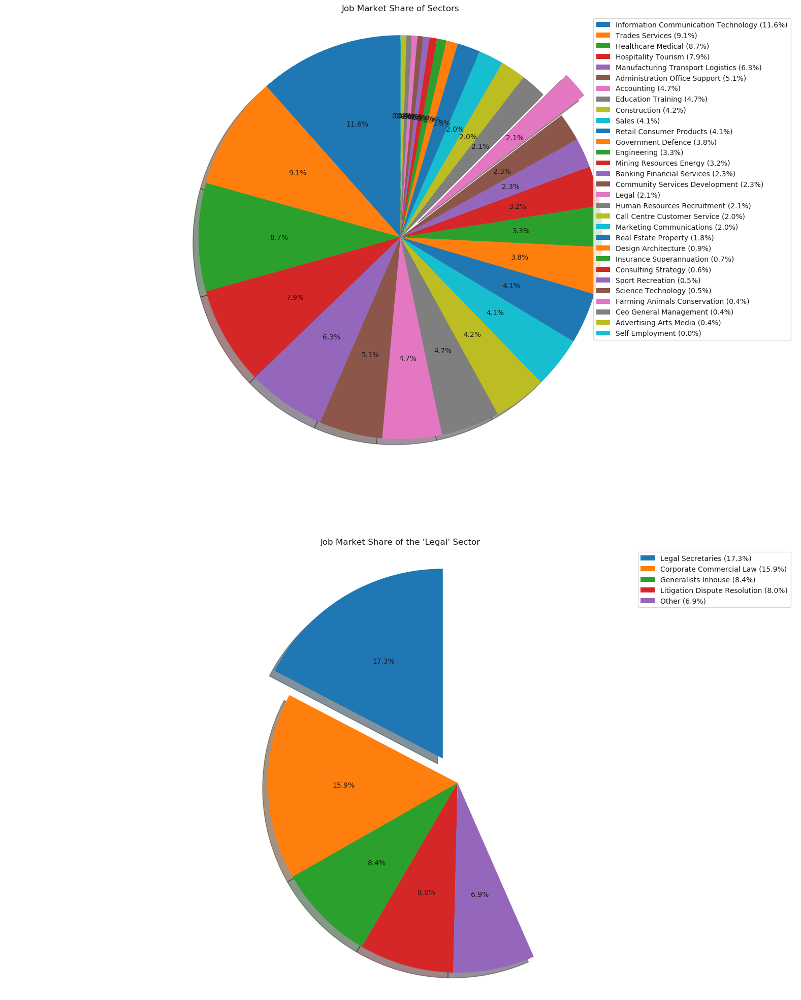

In [65]:
# Example function call for the "Legal" sector
student_recommendation("Legal")

The Healthcare Medical sector takes up 8.7% of the job market share.
This makes the Healthcare Medical sector rank 3 in job market popularity.
Within the Healthcare Medical sector, Nursing Aged Care is the sub-sector that has the most number of job offerings.
The Nursing Aged Care sub-sector has an annual salary range of $0 to $200,000+.

The top 5 skillsets employers look for in the Healthcare Medical sector are:
1. Communication Skills
2. Aged Care
3. Ahpra Registration
4. Customer Service
5. Drivers Licence


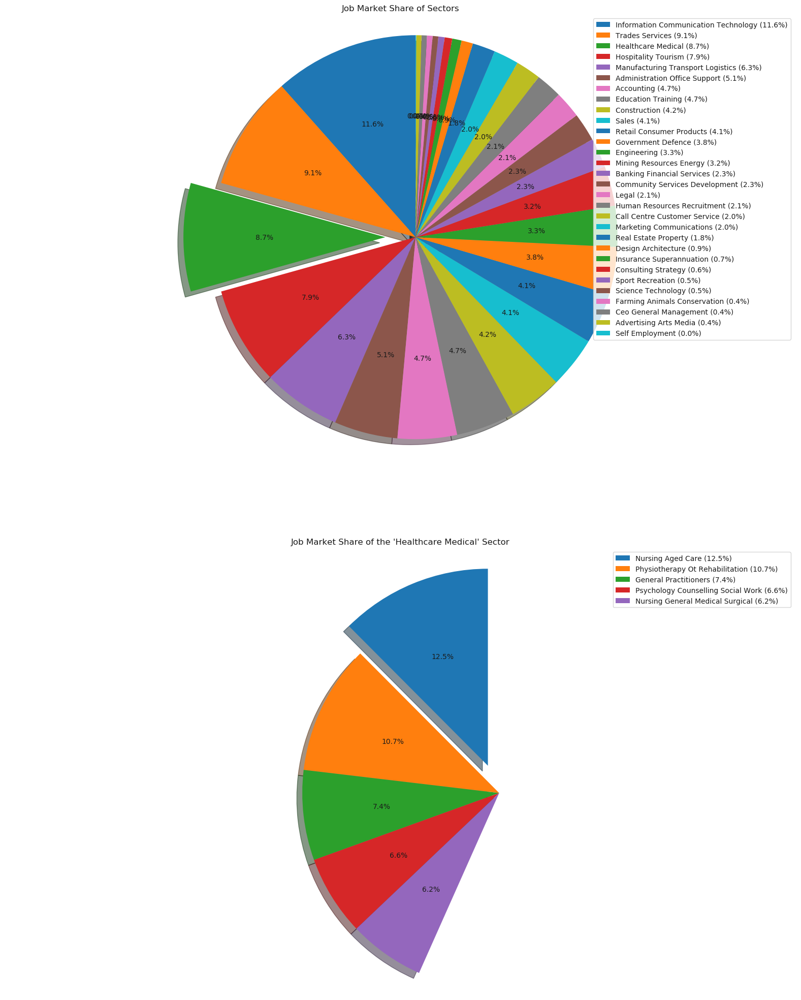

In [66]:
# Example function call for the "Healthcare Medical" sector
student_recommendation("Healthcare Medical")

In [67]:
# Stop the PySpark Session
sc.stop()